In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import os 


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.8.1 pandas==1.4.2 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.10 louvain==0.7.1 pynndescent==0.5.7


Read in the AnnData file.

In [3]:
os.chdir("/Users/fabiola.curion/Documents/projects/donor_deconvolution/deconvolution-project_start")
adata = sc.read_h5ad("filtered_MS_nuclei_hashing_gx12.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 4889 × 33694
    var: 'gene_ids', 'feature_types'


Read in the hashing labels as well as the doublet and donor labels by Hagen pipeline's rescue mode.

In [4]:
obs = pd.read_csv("gx12_final_result_all.csv")
obs

,Barcode,donor_identity
0,ACTTATCTCATGCCAA-1,Hash453-TotalSeqA
1,GGGTCACAGCAGCAGT-1,Hash452-TotalSeqA
2,CAGAGCCGTTGGGATG-1,Hash451-TotalSeqA
3,GGTCACGTCGGTCTAA-1,Hash452-TotalSeqA
4,GACATCACATCAGCGC-1,Hash455-TotalSeqA
...,...,...
4884,ATGATCGTCATGCCAA-1,Hash453-TotalSeqA
4885,CCTCATGTCAAACGTC-1,Hash456-TotalSeqA
4886,TGTTACTCAAGACTGG-1,Hash455-TotalSeqA
4887,AACCACATCATGTCTT-1,Hash453-TotalSeqA


In [5]:
obs_vario = pd.read_csv(
    "gx12_vireo_assignment.csv", 
    usecols=["cell", "donor_id", "classification"])
obs_vario

,cell,donor_id,classification
0,AAACCCAAGGTGTGAC-1,donor1,singlet
1,AAACCCAGTGAGAGGG-1,donor2,singlet
2,AAACGAAAGAATCTAG-1,donor5,singlet
3,AAACGAACACATATGC-1,donor5,singlet
4,AAACGAACACGACTAT-1,donor5,singlet
...,...,...,...
4884,TTTGTTGAGTCCCAGC-1,donor2,singlet
4885,TTTGTTGCAGCGCGTT-1,doublet,doublet
4886,TTTGTTGGTTATCTTC-1,doublet,doublet
4887,TTTGTTGTCCAGTGTA-1,donor0,singlet


Read in the metadata created by Grant-Peters et al. for the previously analyzed cells.

In [6]:
obs_meta_all = pd.read_csv("adataobs_MSmultiplex_DendrouSchirmerJakel_integrated.csv", index_col=0, low_memory=False)
obs_meta_all.head()

,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,age,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
AAACGCTTCGTAGGAG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
AAAGGATTCATGCGGC-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
AAAGGATTCGCTTAAG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
AAAGGTAAGGCCTTCG-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
AACAAAGTCCGATAAC-1-704193_GX53-dendrou,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,43.0,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes


Set Index of metadata as a column. Cut all information after barcode.

In [7]:
obs_meta_all.reset_index(inplace=True)
obs_meta_all['index'] = obs_meta_all['index'].str[:18]
obs_meta_all.head()

,index,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
0,AAACGCTTCGTAGGAG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
1,AAAGGATTCATGCGGC-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
2,AAAGGATTCGCTTAAG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
3,AAAGGTAAGGCCTTCG-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
4,AACAAAGTCCGATAAC-1,704193_GX53,0,NaN,704193_GX53,MS352,NaN,704193_GX53_0,ms,SP,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes


Filter by gx12 in sample_id (not case-sensitive).

In [8]:
obs_meta_all_gx12 = obs_meta_all[obs_meta_all['sample_id'].str.contains('gx12', case=False)]
obs_meta_all_gx12

,index,sample_id,batch,antibody,library_id,patient,block_position,demult_sample_id,disorder,disease_type,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
411,AAAGGGCCAATTTCCT-1,747495_GX12,1,Hash453,747495_GX12,C005,P2D4,747495_GX12_3,control,none,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
412,AACAAGACAACTGGTT-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,2,2,2,1,PhagoProtoAstro_MERTKhi_MEGF10hi,ProtoAstro,astrocytes
413,AACCACAGTTCCGGTG-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
414,AACCCAACACTCTCGT-1,747495_GX12,1,Hash456,747495_GX12,MS425,A3A2,747495_GX12_6,ms,SP,...,NaN,NaN,NaN,2,2,2,1,ProtoAstro_SLC1A2hi_NRXN1hi,ProtoAstro,astrocytes
415,AAGCATCAGAGTCTTC-1,747495_GX12,1,Hash454,747495_GX12,MS438,P2D4,747495_GX12_4,ms,Undetermined,...,NaN,NaN,NaN,2,2,2,1,FibrousAstro-CD44hi_S100Bpos_FOShi_VIMpos,FibrousAstro,astrocytes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44550,TTTCGATCAGTTAGGG-1,747495_GX12,1,Hash454,747495_GX12,MS438,P2D4,747495_GX12_4,ms,Undetermined,...,NaN,NaN,NaN,1,1,1,2,CUX2_LAMP5_YWHAHhi,CUX2,neurons
44551,TTTCGATGTGTCGATT-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,9,10,9,8,FEZF2_SEMA3Ehi,FEZF2,neurons
44552,TTTGGAGTCGAGAATA-1,747495_GX12,1,Hash451,747495_GX12,C014_d,P5C3,747495_GX12_1,control,none,...,NaN,NaN,NaN,3,9,8,9,RORB_TOXhi_ARHGAP15hi,RORB,neurons
44553,TTTGGTTAGATAGGGA-1,747495_GX12,1,Hash455,747495_GX12,C064,A2D1,747495_GX12_5,control,none,...,NaN,NaN,NaN,5,7,6,6,VIP_HGFAC,VIP,neurons


Merge observersations to get the correct order.

In [9]:
obs_ordered = pd.merge(obs_vario, obs, left_on='cell', right_on='Barcode', how='outer')
obs_ordered

,cell,donor_id,classification,Barcode,donor_identity
0,AAACCCAAGGTGTGAC-1,donor1,singlet,AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA
1,AAACCCAGTGAGAGGG-1,donor2,singlet,AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA
2,AAACGAAAGAATCTAG-1,donor5,singlet,AAACGAAAGAATCTAG-1,Hash452-TotalSeqA
3,AAACGAACACATATGC-1,donor5,singlet,AAACGAACACATATGC-1,Hash452-TotalSeqA
4,AAACGAACACGACTAT-1,donor5,singlet,AAACGAACACGACTAT-1,Hash452-TotalSeqA
...,...,...,...,...,...
4884,TTTGTTGAGTCCCAGC-1,donor2,singlet,TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA
4885,TTTGTTGCAGCGCGTT-1,doublet,doublet,TTTGTTGCAGCGCGTT-1,doublet
4886,TTTGTTGGTTATCTTC-1,doublet,doublet,TTTGTTGGTTATCTTC-1,doublet
4887,TTTGTTGTCCAGTGTA-1,donor0,singlet,TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA


Merge Hadge pipeline's obs information and the metadata for gx12. Not all cells have a match in the gx12 dataset. Here NaN is put in for those columns.

In [10]:
merged_obs = pd.merge(obs_ordered, obs_meta_all_gx12, left_on='cell', right_on='index', how='outer')
merged_obs

,cell,donor_id,classification,Barcode,donor_identity,index,sample_id,batch,antibody,library_id,...,tissue,library,brain_region,leiden_res_0.1,leiden_res_0.3,leiden_res_0.5,leiden_res_1,cluster_label,lowres_cluster_label,bucket
0,AAACCCAAGGTGTGAC-1,donor1,singlet,AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,AAACCCAAGGTGTGAC-1,747495_GX12,1,Hash451,747495_GX12,...,NaN,NaN,NaN,1.0,1.0,1.0,2.0,CUX2_PALMDpos_FREM3pos,CUX2,neurons
1,AAACCCAGTGAGAGGG-1,donor2,singlet,AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AAACGAAAGAATCTAG-1,donor5,singlet,AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,AAACGAAAGAATCTAG-1,747495_GX12,1,Hash452,747495_GX12,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,oligodendrocytes
3,AAACGAACACATATGC-1,donor5,singlet,AAACGAACACATATGC-1,Hash452-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AAACGAACACGACTAT-1,donor5,singlet,AAACGAACACGACTAT-1,Hash452-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4884,TTTGTTGAGTCCCAGC-1,donor2,singlet,TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4885,TTTGTTGCAGCGCGTT-1,doublet,doublet,TTTGTTGCAGCGCGTT-1,doublet,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4886,TTTGTTGGTTATCTTC-1,doublet,doublet,TTTGTTGGTTATCTTC-1,doublet,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4887,TTTGTTGTCCAGTGTA-1,donor0,singlet,TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA,TTTGTTGTCCAGTGTA-1,747495_GX12,1,Hash454,747495_GX12,...,NaN,NaN,NaN,1.0,1.0,1.0,2.0,CUX2_PALMDpos_FREM3pos,CUX2,neurons


Changing names of some columns to paper_X to not interfere with later column generation.

In [11]:
merged_obs = merged_obs.rename(columns={'doublet_scores' : 'paper_doublet_scores', 'predicted_doublets': 'paper_predicted_doublets'})

Adding only a few selected columns to not interfere with later doubled column labeling by further analysis.

In [12]:
merged_obs_sel = merged_obs.loc[:, ["Barcode", "donor_identity", "donor_id", "cluster_label", "lowres_cluster_label", "sample_id", "bucket", "disorder", "paper_doublet_scores", "paper_predicted_doublets"]]
merged_obs_sel.set_index('Barcode', inplace=True)
merged_obs_sel

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets
Barcode,,,,,,,,,
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False
AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AAACGAACACGACTAT-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGCAGCGCGTT-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGTTGGTTATCTTC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Adding the created dataframe to adata.obs.

In [13]:
#adata.obs = merged_obs_sel
adata.obs.head()
adata.obs = merged_obs_sel.loc[adata.obs_names,]

In [14]:
adata

AnnData object with n_obs × n_vars = 4889 × 33694
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets'
    var: 'gene_ids', 'feature_types'

In [15]:
adata.var_names_make_unique()

In [16]:
adata.shape

(4889, 33694)

Adding a column 'doublet_classification_pipeline' that shows doublet / no doublet as given by Hagen pipeline.

In [17]:
doublet_boolean = adata.obs['donor_identity'].str.contains("doublet")
adata.obs['doublet_classification_pipeline'] = ['doublet' if result else 'no doublet' for result in doublet_boolean]
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False,no doublet
AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False,no doublet
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
AAACGAACACGACTAT-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet
TTTGTTGCAGCGCGTT-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,doublet
TTTGTTGGTTATCTTC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,doublet
TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA,donor0,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,ms,0.072565,False,no doublet


Doublet score generation via scrublet and addition to adata.obs as a new comlumn.

In [18]:
import scrublet as scr
scrub = scr.Scrublet(adata.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.57
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 7.6 seconds


In [19]:
print(doublet_scores)

[0.07637232 0.12479741 0.06861642 ... 0.25414365 0.11987382 0.04020979]


In [20]:
adata.obs['doublet_score'] = doublet_scores
adata.obs['predicted_doublets'] = predicted_doublets

In [21]:
adata.obs['predicted_doublets'].unique()

array([False])

In [22]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline,doublet_score,predicted_doublets
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False,no doublet,0.076372,False
AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.124797,False
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False,no doublet,0.068616,False
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.025223,False
AAACGAACACGACTAT-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.055499,False
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.017520,False
TTTGTTGCAGCGCGTT-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,doublet,0.215496,False
TTTGTTGGTTATCTTC-1,doublet,doublet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,doublet,0.254144,False
TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA,donor0,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,ms,0.072565,False,no doublet,0.119874,False


Strict threshold of 0.2 in doublet score to exclude non-valid cells from the analysis.

In [23]:
adata = adata[~(adata.obs['doublet_score'] > 0.2), :]

In [24]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline,doublet_score,predicted_doublets
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False,no doublet,0.076372,False
AAACCCAGTGAGAGGG-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.124797,False
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False,no doublet,0.068616,False
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.025223,False
AAACGAACACGACTAT-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.055499,False
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGATAGGGA-1,Hash455-TotalSeqA,donor4,VIP_HGFAC,VIP,747495_GX12,neurons,control,0.069595,False,no doublet,0.110778,False
TTTGGTTAGCACTCAT-1,Hash455-TotalSeqA,donor4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.066225,False
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,0.017520,False
TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA,donor0,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,ms,0.072565,False,no doublet,0.119874,False


Start of filtering and QC. 

Showing highest expressed genes

normalizing counts per cell


/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


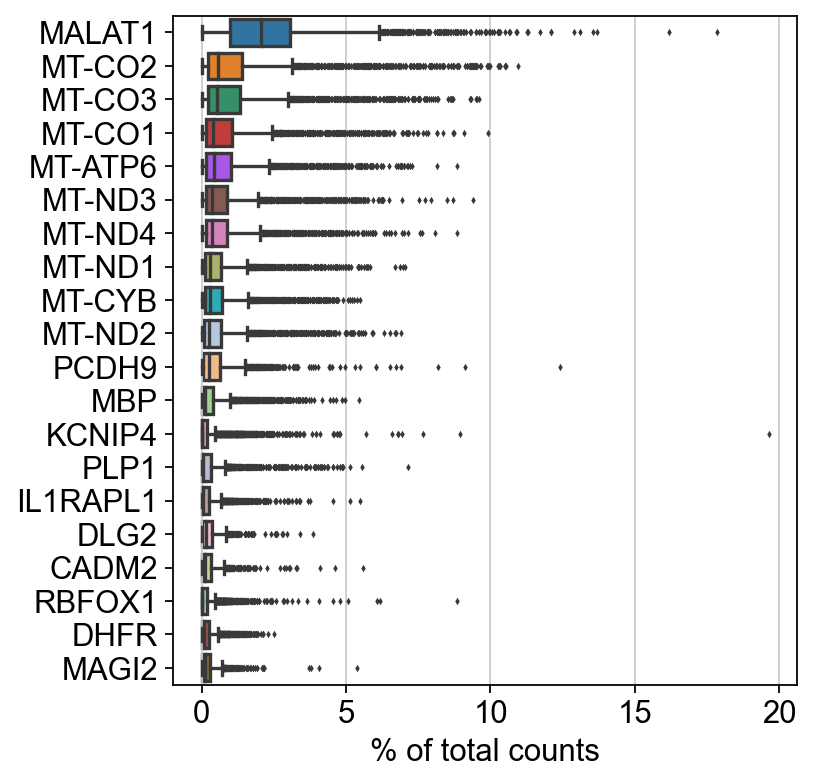

In [25]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Filtering out cells with little genes and genes that are expressed in less than 3 cells.

In [26]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 1 cells that have less than 200 genes expressed
filtered out 8196 genes that are detected in less than 3 cells


Calculate QC metrics.

In [27]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

Plot QC metrics.

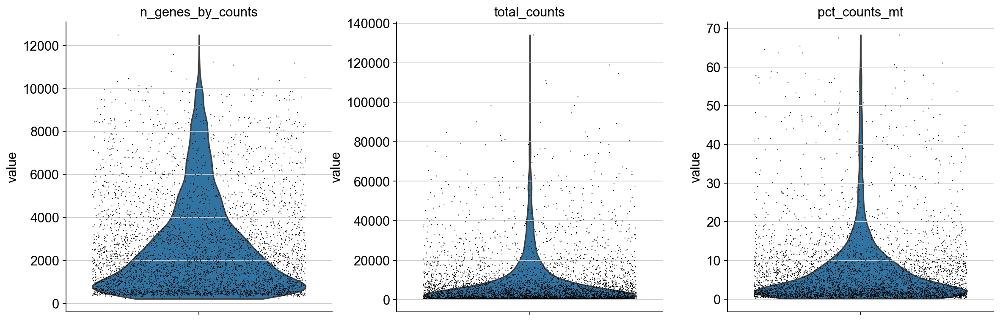

In [28]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Check for the probable cutoffs used in the dataset by the previous MS analysis. For mitochondria 10% was used. Then plot the metrics in scatter plots.

In [29]:
print(obs_meta_all_gx12["pct_counts_mt"].max())
print(obs_meta_all_gx12["n_genes_by_counts"].max())

9.982435
10849


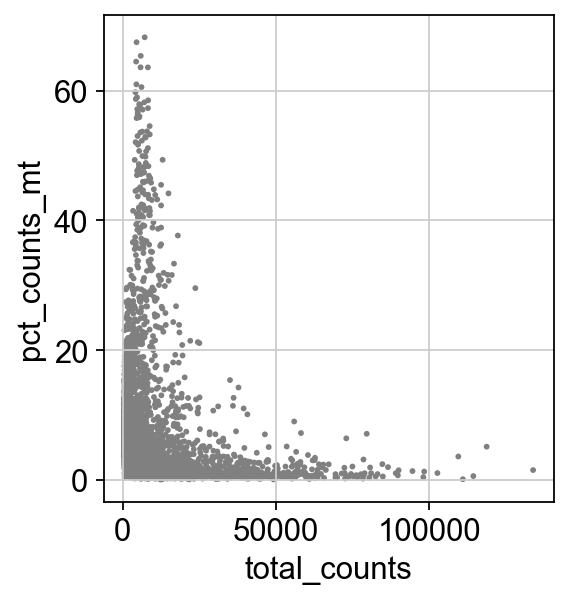

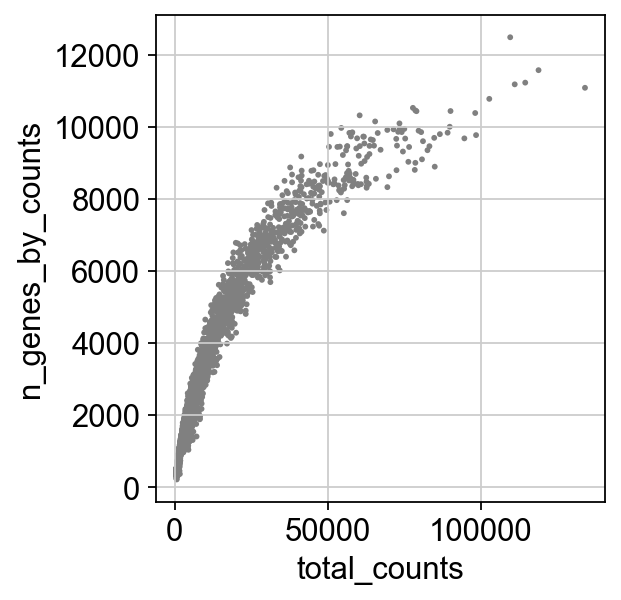

In [30]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [31]:
print("min max n_genes by counts in paper's metadata")
print(obs_meta_all_gx12['n_genes_by_counts'].min(),obs_meta_all_gx12['n_genes_by_counts'].max())
print("min max total counts in paper's metadata")
print(obs_meta_all_gx12['total_counts'].min(),obs_meta_all_gx12['total_counts'].max())

min max n_genes by counts in paper's metadata
336 10849
min max total counts in paper's metadata
702.0 127691.0


In [32]:
print("min max n_genes by counts in new analysis")
print(adata.obs['n_genes_by_counts'].min(),adata.obs['n_genes_by_counts'].max())
print("min max total counts in new analysis")
print(adata.obs['total_counts'].min(),adata.obs['total_counts'].max())

min max n_genes by counts in new analysis
214 12484
min max total counts in new analysis
500.0 134032.0


Exclude cells with higher n_genes_by_counts and pct_counts_mt than seen in the paper.

In [33]:
adata = adata[adata.obs.n_genes_by_counts < 10849, :] # adjusted 2500 to 10894 by previous analysis
adata = adata[adata.obs.pct_counts_mt < 10, :] # under 10 percent as cutoff

Run normalization with a target of 10,000.

In [34]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Apply logarithmic transformation.

In [35]:
sc.pp.log1p(adata)

Plot highly variable genes.

In [36]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


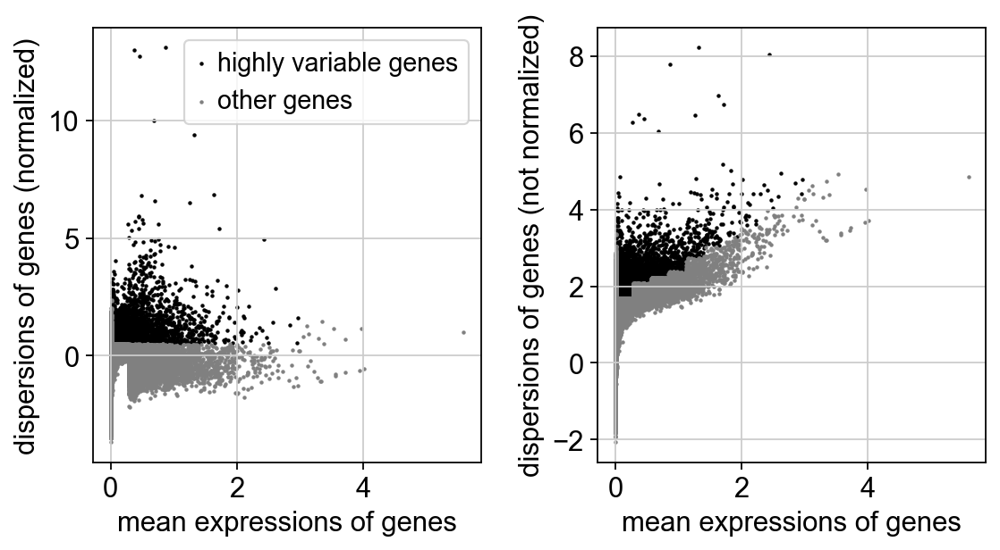

In [37]:
sc.pl.highly_variable_genes(adata)

Add adata to adata.raw

In [38]:
adata.raw = adata

Include only highly variable genes.

In [39]:
adata = adata[:, adata.var.highly_variable]

Regress out by total_counts and pct_counts_mt.

In [40]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:44)


Scaling of the gene expression data.

In [41]:
sc.pp.scale(adata, max_value=10)

Perform principal component analysis. And plot PCAs.

In [42]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


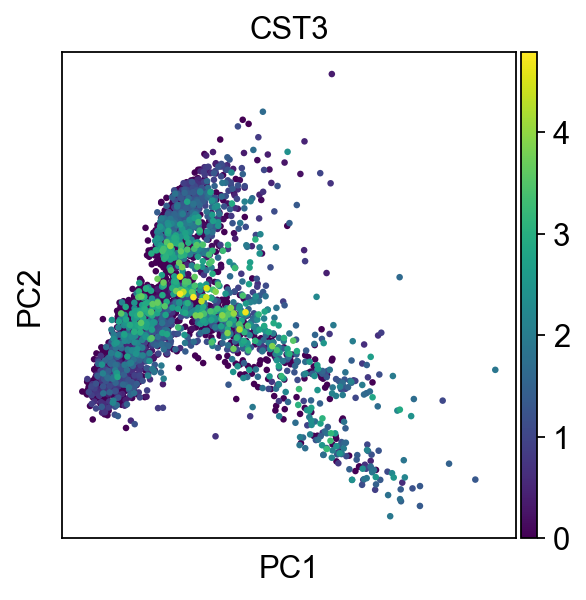

In [43]:
sc.pl.pca(adata, color='CST3')

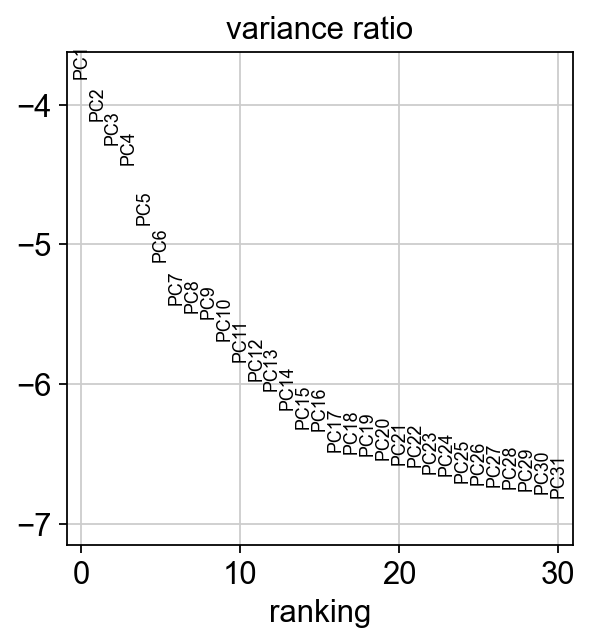

In [44]:
sc.pl.pca_variance_ratio(adata, log=True)

In [45]:
adata

AnnData object with n_obs × n_vars = 3443 × 7451
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_classification_pipeline', 'doublet_score', 'predicted_doublets', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

Compute the neighborhood graph.

In [46]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


Perform dimensionality reduction by UMAP.

In [47]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


Leiden Cluster in different resolutions.

In [48]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [49]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)
sc.tl.leiden(adata, key_added="leiden_res2", resolution=2.0)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden_res0_25', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res0_5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden_res1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 35 clusters and added
    'leiden_res2', the cluster labels (adata.obs, categorical) (0:00:00)


Plot some QC and donor identity UMAPs.

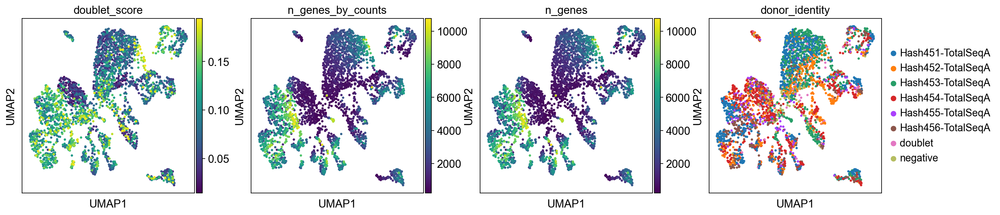

In [50]:
sc.pl.umap(adata, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'donor_identity'])

Add a column to adata.obs that only shows doublet vs. no doublet.

In [51]:
doublet_boolean = adata.obs['donor_identity'].str.contains("doublet")
adata.obs['doublet_classification_pipeline'] = ['doublet' if result else 'no doublet' for result in doublet_boolean]

In [52]:
adata.obs

,donor_identity,donor_id,cluster_label,lowres_cluster_label,sample_id,bucket,disorder,paper_doublet_scores,paper_predicted_doublets,doublet_classification_pipeline,...,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,leiden_res0_25,leiden_res0_5,leiden_res1,leiden_res2
AAACCCAAGGTGTGAC-1,Hash451-TotalSeqA,donor1,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,control,0.043699,False,no doublet,...,5147,5147,21181.0,248.0,1.170861,3,2,2,3,5
AAACGAAAGAATCTAG-1,Hash452-TotalSeqA,donor5,OG - OPALINlow_SLC5A11hi_RBFOXhi,OG - OPALINlow_SLC5A11hi_RBFOXhi,747495_GX12,oligodendrocytes,ms,0.031493,False,no doublet,...,1137,1137,1954.0,37.0,1.893552,10,0,0,10,3
AAACGAACACATATGC-1,Hash452-TotalSeqA,donor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,892,892,1238.0,75.0,6.058158,1,1,1,1,0
AAACGAACATCAGCAT-1,Hash454-TotalSeqA,donor0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,3065,3065,6661.0,499.0,7.491367,1,1,1,1,24
AAACGAATCTATTGTC-1,Hash453-TotalSeqA,donor2,OG - OPALINhi_PLXDC2hi,OG - OPALINhi_PLXDC2hi,747495_GX12,oligodendrocytes,control,0.050745,False,no doublet,...,4125,4124,14106.0,1250.0,8.861478,6,0,0,6,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGATAGGGA-1,Hash455-TotalSeqA,donor4,VIP_HGFAC,VIP,747495_GX12,neurons,control,0.069595,False,no doublet,...,2441,2441,5087.0,207.0,4.069196,9,8,8,9,17
TTTGGTTAGCACTCAT-1,Hash455-TotalSeqA,donor4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,2088,2087,6276.0,154.0,2.453792,5,3,4,5,8
TTTGTTGAGTCCCAGC-1,Hash453-TotalSeqA,donor2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no doublet,...,481,481,632.0,23.0,3.639241,2,0,3,2,23
TTTGTTGTCCAGTGTA-1,Hash454-TotalSeqA,donor0,CUX2_PALMDpos_FREM3pos,CUX2,747495_GX12,neurons,ms,0.072565,False,no doublet,...,7714,7708,36918.0,191.0,0.517363,3,2,2,3,16


Plot some QC parameter and doublet identification by Hadge parameters UMAPs.

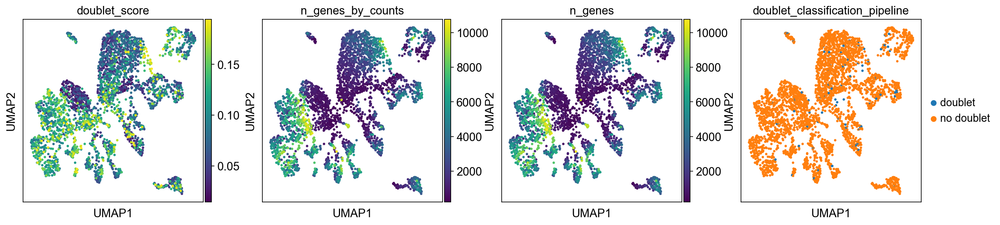

In [53]:
sc.pl.umap(adata, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'doublet_classification_pipeline'])

Generating a column that labels all NaN cells in the bucket column as new. Then combine these with the leiden_clustering.

In [54]:
adata.obs['newold'] = np.where(pd.isna(adata.obs['bucket']), 'new', 'old')
adata.obs["leiden_new_old"]=adata.obs['leiden'].str.cat(adata.obs['newold'], sep='_')
adata.obs["leiden_res0_25_new_old"]=adata.obs['leiden_res0_25'].str.cat(adata.obs['newold'], sep='_')

Turning NaN cells in to "New cells" in the adata.obs.

In [55]:
adata.obs["coarse_id"] = adata.obs["bucket"]
adata.obs["coarse_id"] = adata.obs["coarse_id"].astype("string")


adata.obs["coarse_id"][adata.obs["coarse_id"].isna()]="New cells"
adata.obs["coarse_id"]=adata.obs["coarse_id"].astype("category")
adata.obs["coarse_id"].cat.categories

Index(['New cells', 'astrocytes', 'cd74', 'endothelial', 'neurons',
       'oligodendrocytes'],
      dtype='string')

Plotting the cell type description the paper gave over all cells including the new ones to identify clusters.

In [56]:
color_palette =dict(zip(['New cells', 'astrocytes', 'cd74', 'endothelial', 'neurons','oligodendrocytes']
    ,['#f54284', '#CCBB44', '#228833', '#4477AA', '#66CCEE', '#75375a']))

custom_order = ['astrocytes', 'cd74', 'endothelial', 'neurons','oligodendrocytes','New cells' ]
adata.obs["coarse_id"].cat.reorder_categories(custom_order, inplace=True)

/var/folders/q1/jqpy4lk14cg0950t1mfrcf7cw66yvr/T/ipykernel_74531/2776424453.py:5: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs["coarse_id"].cat.reorder_categories(custom_order, inplace=True)


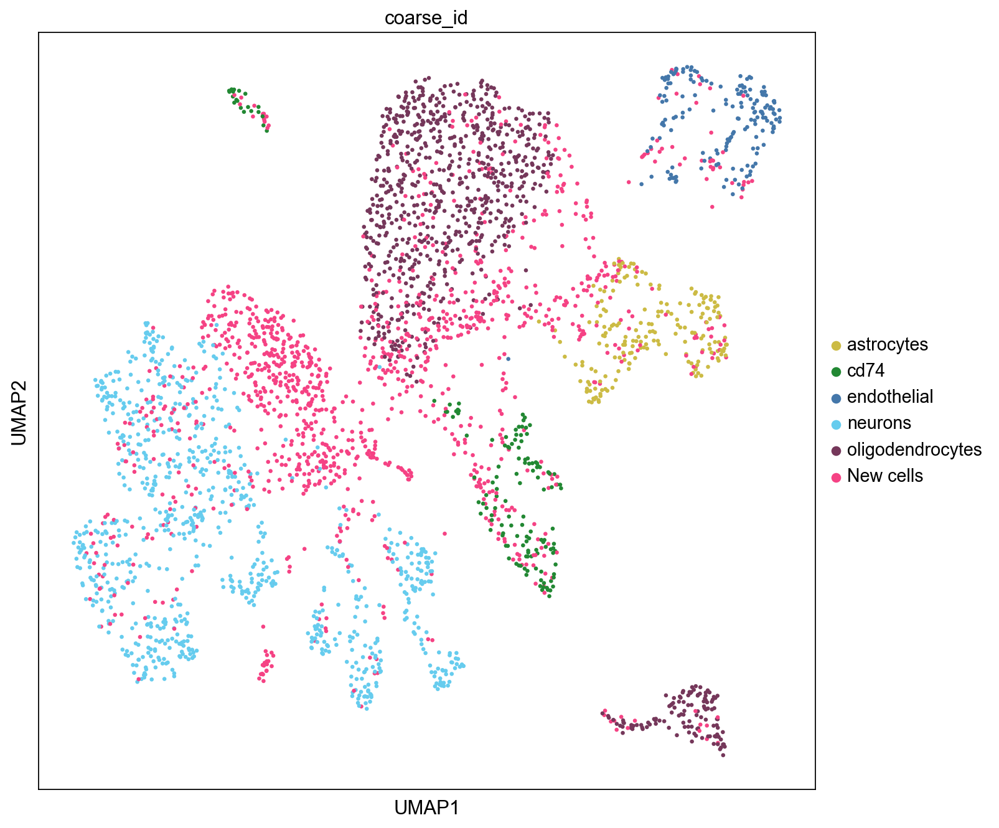

In [57]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 10))
plt.show(sc.pl.umap(adata, color=["coarse_id"], palette = color_palette,ax=ax))

Saving the UMAP above.

In [58]:
fig_save="gx12_final/"
if not os.path.exists(fig_save):
    os.mkdir(fig_save)
sc.settings.figdir=fig_save
sc.settings.set_figure_params(dpi_save=300, figsize=(7,7))


Excluding cells that had no donor_id and plot them.

                       donor_identity donor_id  \
AAACCCAAGGTGTGAC-1  Hash451-TotalSeqA   donor1   
AAACGAAAGAATCTAG-1  Hash452-TotalSeqA   donor5   
AAACGAACACATATGC-1  Hash452-TotalSeqA   donor5   
AAACGAACATCAGCAT-1  Hash454-TotalSeqA   donor0   
AAACGAATCTATTGTC-1  Hash453-TotalSeqA   donor2   
...                               ...      ...   
TTTGGTTAGATAGGGA-1  Hash455-TotalSeqA   donor4   
TTTGGTTAGCACTCAT-1  Hash455-TotalSeqA   donor4   
TTTGTTGAGTCCCAGC-1  Hash453-TotalSeqA   donor2   
TTTGTTGTCCAGTGTA-1  Hash454-TotalSeqA   donor0   
TTTGTTGTCGCTTAAG-1  Hash451-TotalSeqA   donor1   

                                       cluster_label  \
AAACCCAAGGTGTGAC-1            CUX2_PALMDpos_FREM3pos   
AAACGAAAGAATCTAG-1  OG - OPALINlow_SLC5A11hi_RBFOXhi   
AAACGAACACATATGC-1                               NaN   
AAACGAACATCAGCAT-1                               NaN   
AAACGAATCTATTGTC-1            OG - OPALINhi_PLXDC2hi   
...                                              ...   
TTTGGTT

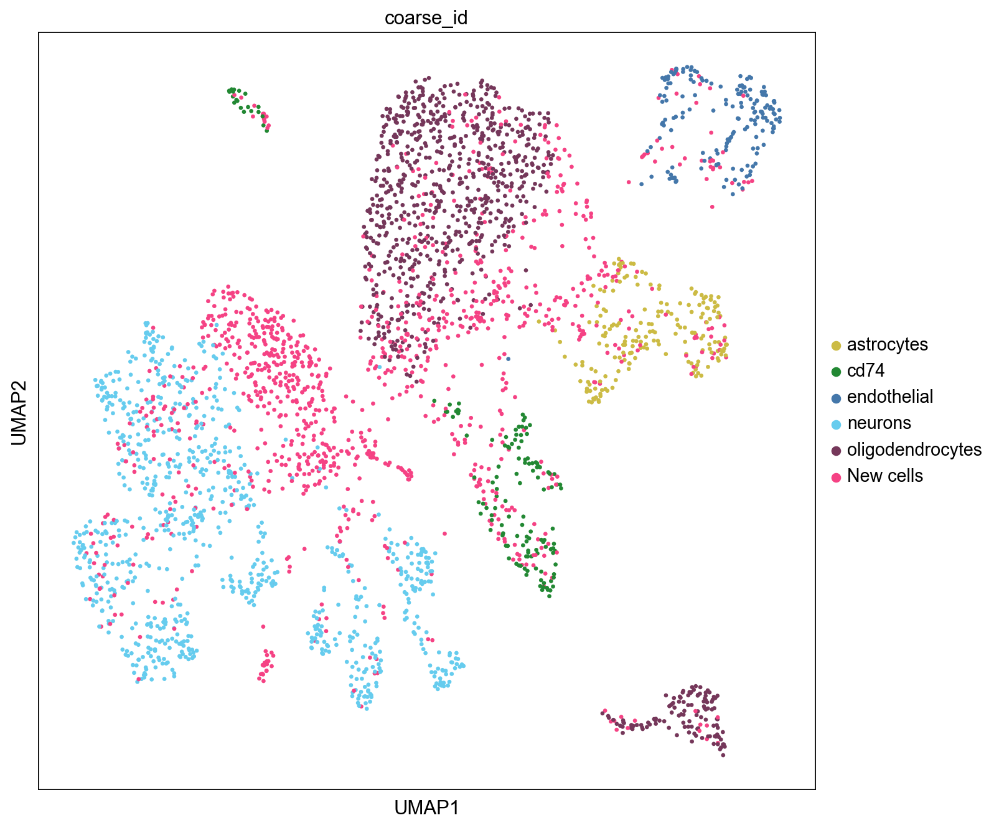

In [59]:
adata_donor_assigned = adata[~(adata.obs['donor_identity'] == 'negative'), :]
print(adata_donor_assigned.obs)
fig, ax = plt.subplots(figsize=(10, 10))
plt.show(sc.pl.umap(adata_donor_assigned, color=["coarse_id"], ax=ax))

Used Hadge pipeline's doublet prediction to filter out doublets and rerun PCA, UMAP and different Leiden resolutions.

View of AnnData object with n_obs × n_vars = 3208 × 7451
    obs: 'donor_identity', 'donor_id', 'cluster_label', 'lowres_cluster_label', 'sample_id', 'bucket', 'disorder', 'paper_doublet_scores', 'paper_predicted_doublets', 'doublet_classification_pipeline', 'doublet_score', 'predicted_doublets', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res2', 'newold', 'leiden_new_old', 'leiden_res0_25_new_old', 'coarse_id'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'donor_identity_colors', 'doublet_classification_pipeline_colors', 'coarse_id_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'
computing PCA
    on highly variabl

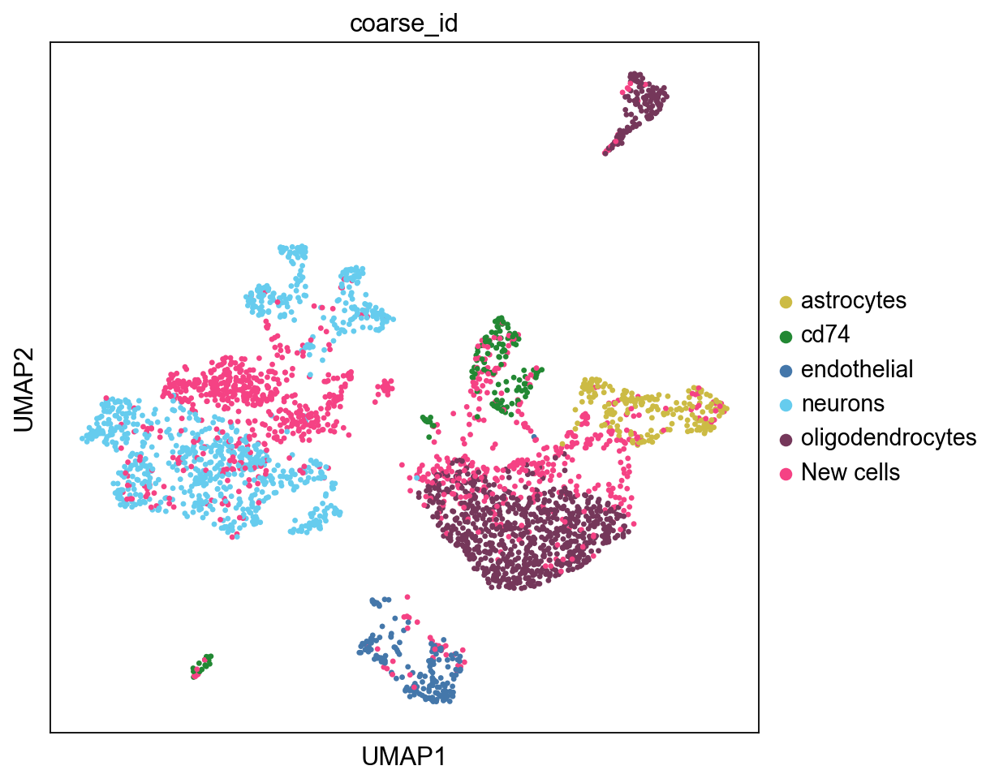

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r0_25', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_r0_5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 36 clusters and added
    'leiden_r2', the cluster labels (adata.obs, categorical) (0:00:00)


In [60]:
adata_donor_assigned_no_doublets = adata_donor_assigned[~(adata_donor_assigned.obs['donor_identity'] == 'doublet'), :]
print(adata_donor_assigned_no_doublets)

sc.tl.pca(adata_donor_assigned_no_doublets)
sc.tl.umap(adata_donor_assigned_no_doublets)
sc.pl.umap(adata_donor_assigned_no_doublets, color="coarse_id",palette= color_palette)

sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r0_25", resolution=0.25)
sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r0_5", resolution=0.5)
sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r1", resolution=1.0)
sc.tl.leiden(adata_donor_assigned_no_doublets, key_added="leiden_r2", resolution=2.0)


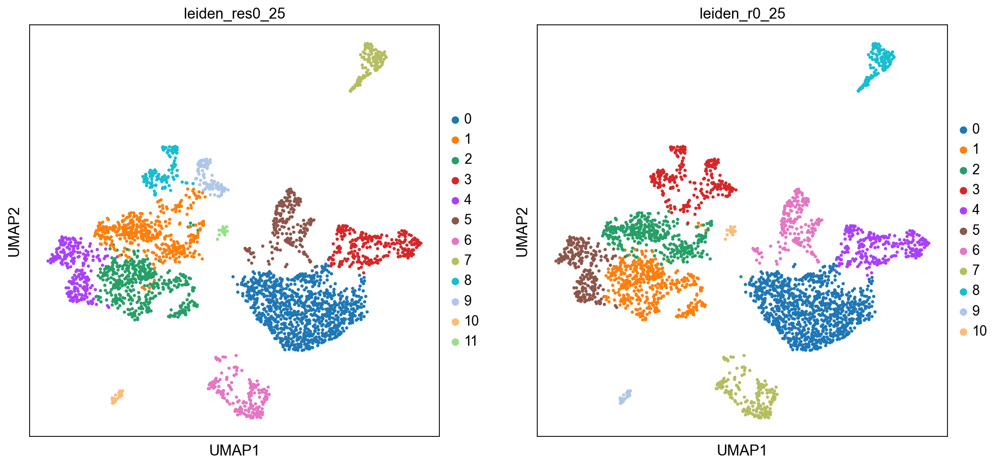

In [61]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=["leiden_res0_25","leiden_r0_25"])

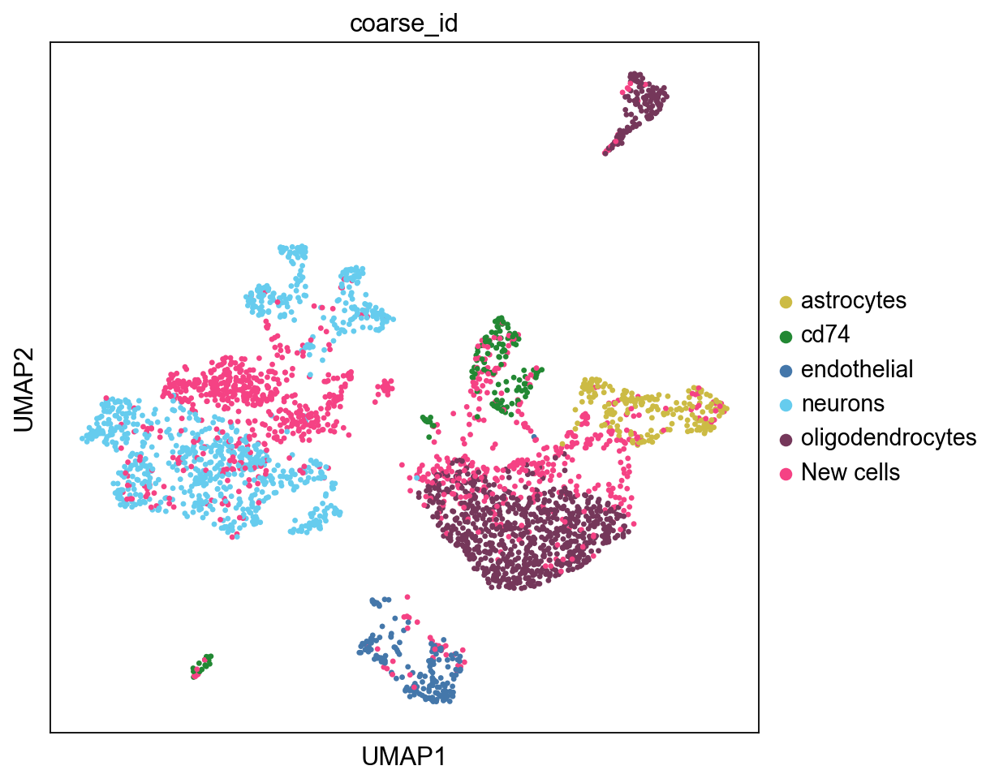

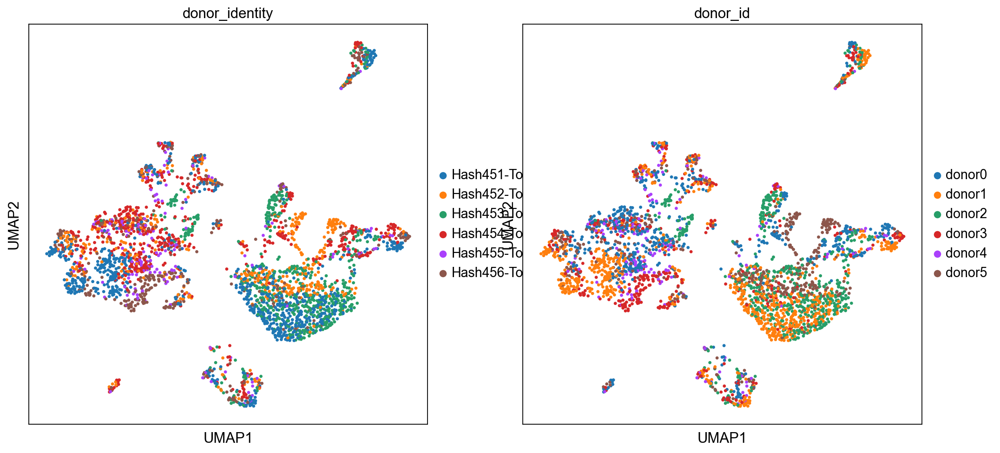

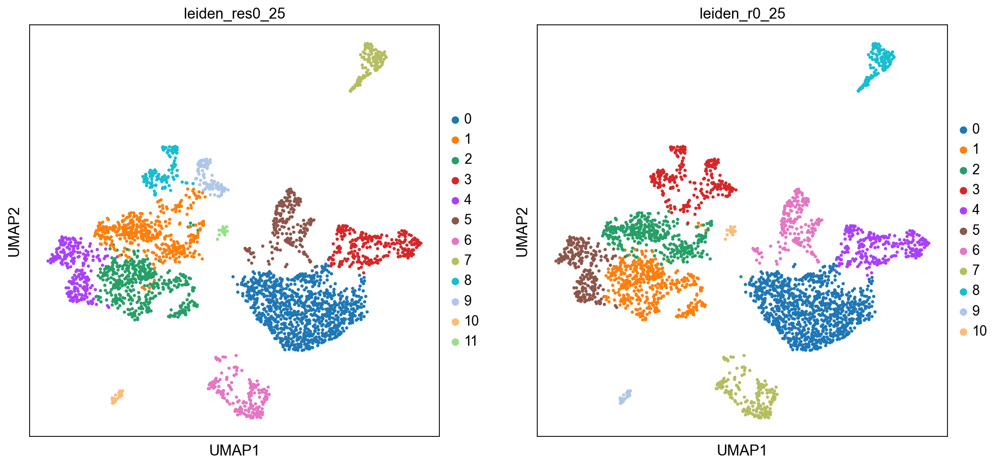

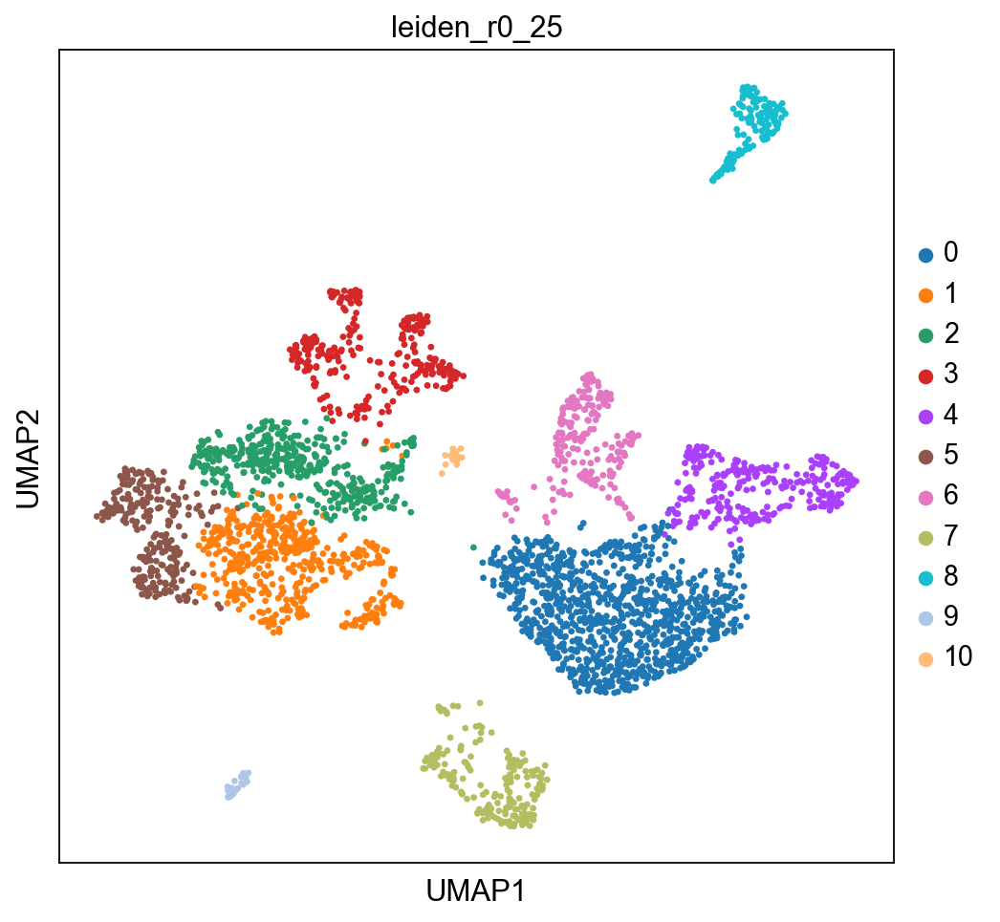

In [62]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=["coarse_id"], palette = color_palette, save = "coarse_id_color.png")
sc.pl.umap(adata_donor_assigned_no_doublets, save=".png", color=["donor_identity", "donor_id"])
sc.pl.umap(adata_donor_assigned_no_doublets, color=["leiden_res0_25","leiden_r0_25"],save ="leiden_compare.png")

sc.pl.umap(adata_donor_assigned_no_doublets, color=["leiden_r0_25"],save ="leiden_use.png")

Plotting doublet and QC parameters after removal of Hadge pipeline predicted doublets and unassigned donors.

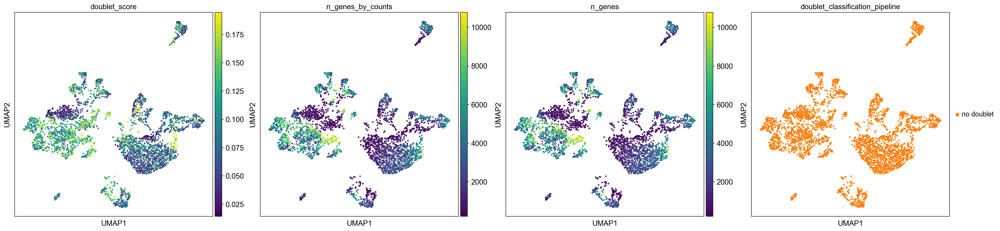

In [63]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=['doublet_score', 'n_genes_by_counts', 'n_genes', 'doublet_classification_pipeline'])

In [64]:
sc.settings.verbosity = 2  # reduce the verbosity

Showing ranked genes by wilcoxon.

ranking genes
    finished (0:00:21)


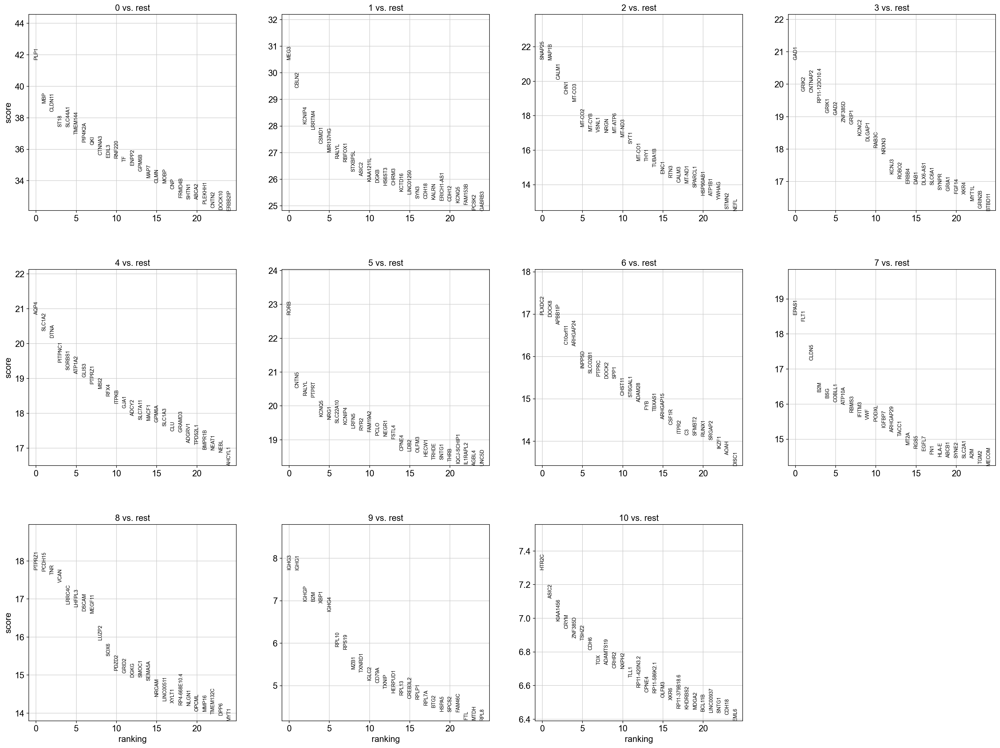

In [65]:
sc.tl.rank_genes_groups(adata_donor_assigned_no_doublets, "leiden_r0_25", method='wilcoxon')
sc.pl.rank_genes_groups(adata_donor_assigned_no_doublets, n_genes=25, sharey=False)

Plotting UMAPs of highest ranked genes for Cluster 2.

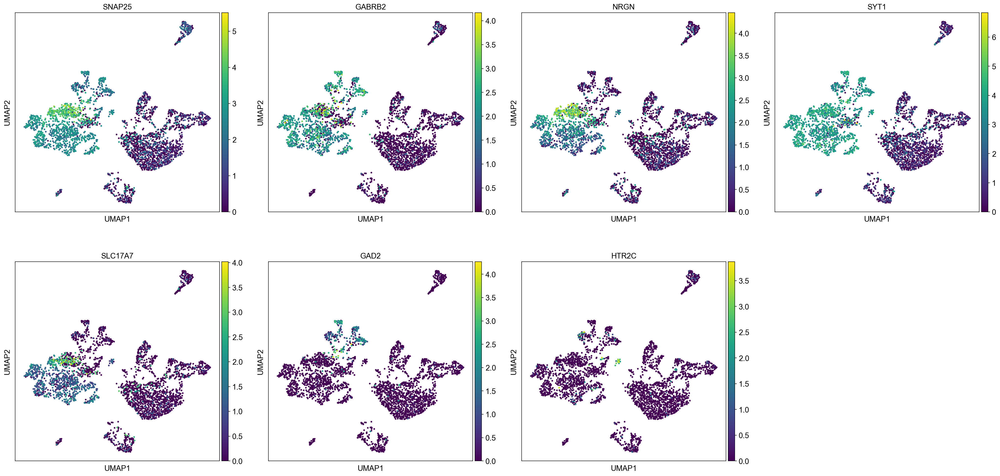

In [66]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=['SNAP25', "GABRB2", "NRGN", "SYT1", "SLC17A7", "GAD2", "HTR2C"])

Looking more closely at the new leiden cluster 10 with QC parameters. 

In [67]:
cluster_new = adata_donor_assigned_no_doublets.obs[adata_donor_assigned_no_doublets.obs["leiden_r0_25"] == '10']

In [68]:
cluster_new['doublet_score'].describe()

count    18.000000
mean      0.152045
std       0.028164
min       0.098748
25%       0.136965
50%       0.157650
75%       0.166797
max       0.194631
Name: doublet_score, dtype: float64

Plot cells in dotplot with some neuronal markers.

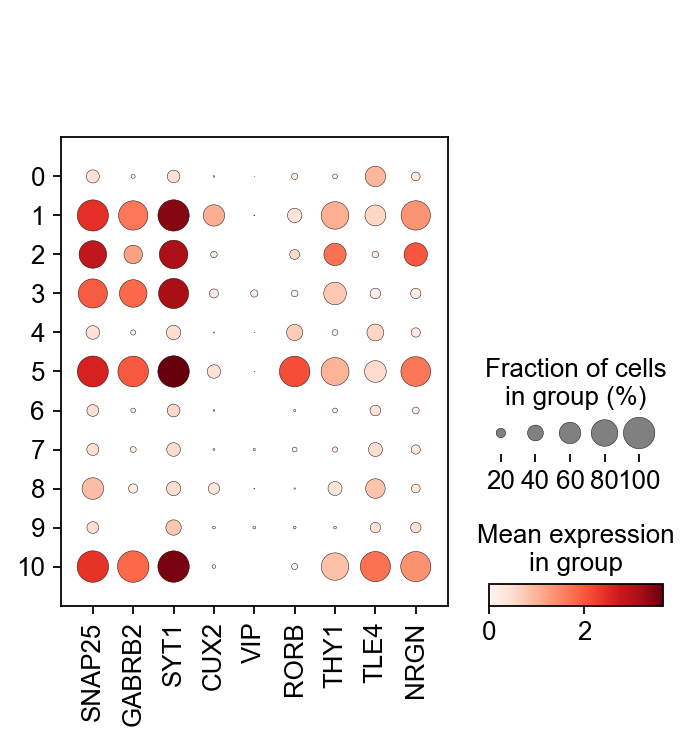

In [69]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ["SNAP25", "GABRB2", "SYT1", "CUX2", "VIP", "RORB", "THY1", "TLE4", "NRGN"], groupby='leiden_r0_25')

Plotting a small overview of all leiden 0.25 clusters with 3 dotplots with different genes included.

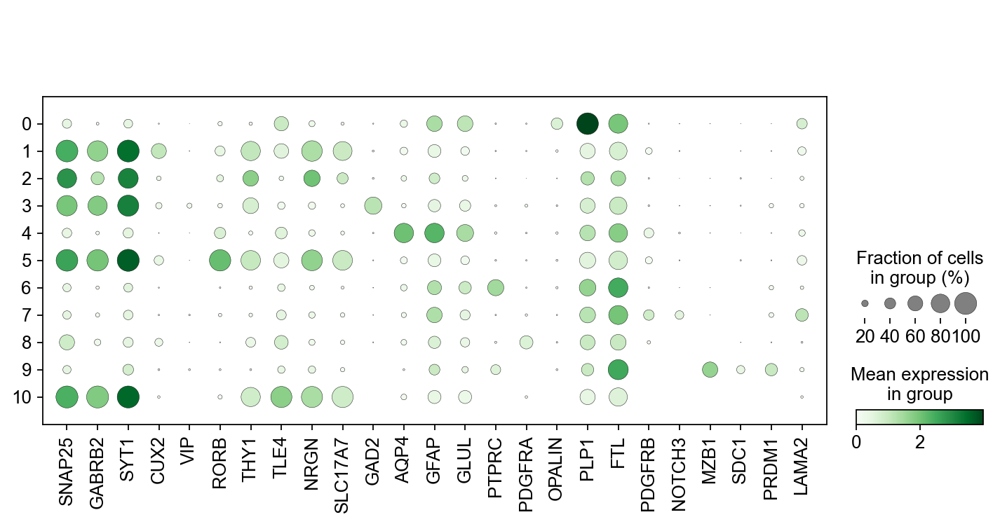

In [70]:
gene_sel=["SNAP25","GABRB2","SYT1","CUX2","VIP",
"RORB","THY1","TLE4","NRGN","SLC17A7",
"GAD2","AQP4","GFAP","GLUL","PTPRC",
"PDGFRA","OPALIN","PLP1","FTL","PDGFRB",
"NOTCH3","MZB1","SDC1","PRDM1","LAMA2"]
sc.pl.dotplot(adata_donor_assigned_no_doublets, gene_sel,
                                                 color_map='Greens',groupby='leiden_r0_25')

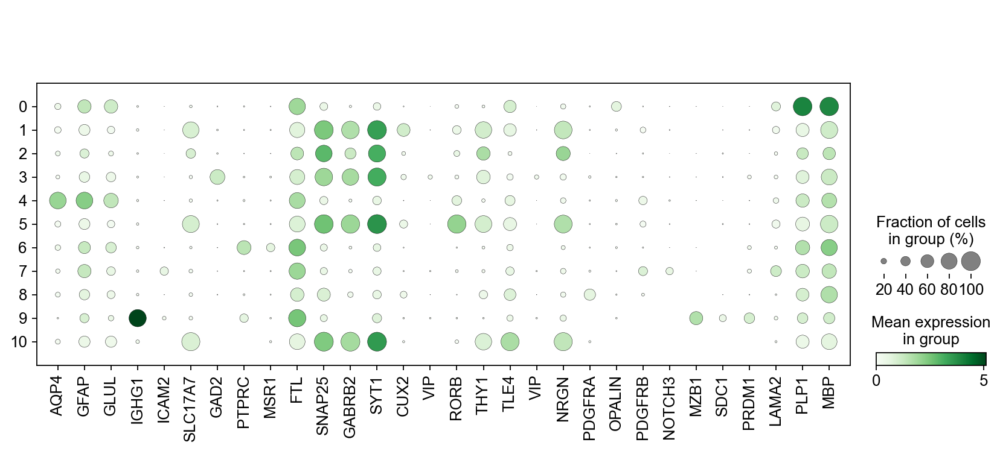

In [71]:
gene_sel2=["AQP4","GFAP","GLUL","IGHG1","ICAM2","SLC17A7","GAD2","PTPRC","MSR1","FTL",
           "SNAP25","GABRB2","SYT1","CUX2","VIP","RORB","THY1","TLE4","VIP","NRGN","PDGFRA",
           "OPALIN","PDGFRB","NOTCH3","MZB1","SDC1","PRDM1","LAMA2","PLP1","MBP"]
sc.pl.dotplot(adata_donor_assigned_no_doublets, gene_sel2,
                                                 color_map='Greens', groupby='leiden_r0_25')

Big overview for cell Markers.

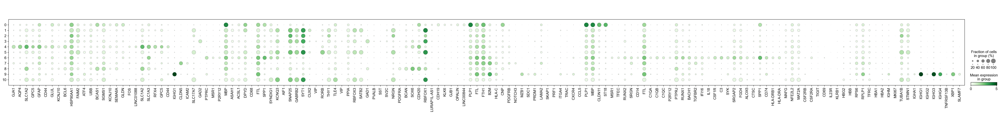

In [72]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, ['GJA1', 'AQP4', 'SLC1A2', 'GPC5', 'GFAP',
'CD44', 'GLUL', 'KCNJ10', 'BCL6', 'HSP90AA1',
'FAIM2', 'ATF4', 'UBB', 'BCAS1', 'SGMS1',
'KCNJ10', 'SEMA6A', 'GLDN', 'FOS', 'LINC01088',
'SLC1A2', 'SLC1A3', 'RFX4', 'GPC5', 'CD44',
'IGHG1', 'CLDN5', 'ICAM2', 'SLC17A7', 'GAD2',
'PTPRC', 'MSR1', 'P2RY12', 'MBP', 'ASAH1',
'ACSL1', 'DPYD', 'CD68', 'FTL', 'SPP1',
'SYNDIG1', 'KCNQ3', 'AIF1', 'SNAP25', 'GABRB2',
'SYT1', 'CUX2', 'VIP', 'RORB', 'THY1',
'TLE4', 'VIP', 'PPIA', 'RBFOX3', 'SATB2',
'GAD1', 'PVALB', 'SST', 'SV2C', 'NRGN',
'PDGFRA', 'BCAN', 'SOX6', 'CDH20', 'RBFOX1',
'LURAP1L-AS1', 'CDH19', 'KLK6', 'GJB1', 'OPALIN',
'LINC00844', 'PLP1',
'FTL', 'FTH1', 'B2M', 'HLA-C', 'CNP',
'PDGFRB', 'NOTCH3', 'MZB1', 'SDC1', 'PRDM1',
'LAMA2', 'SKAP1', 'PRF1', 'ITGA4', 'TRAC',
'CXCR4', 'CCL5', 'PLP1', 'MBP', 'CLDN11',
'ST18', 'MSR1', 'TFEC', 'RUNX2', 'SRGN',
'CD14', 'FTL', 'C1QA', 'C1QB', 'C1QC',
'P2RY12', 'PTPRJ', 'RUNX1', 'BACH1',
'TGFBR2', 'IFI16', 'IL18', 'CSF1R', 'C3',
'SYK', 'SRGAP2', 'FGD4', 'ALOX5',
'CTSC', 'SPP1', 'CD74', 'HLA-DRB1',
'HLA-DRA', 'MAFG', 'NFE2L2',
'MAT2A', 'CSF2RB', 'CSF2RA',
'TIGIT', 'CD69', 'IL23R', 'KLRB1', 'HBG2', 'HBB', 'RPS6',
'RPLP1', 'TFRC', 'HBA1', 'HBA2', 'IGHM',
'MKI67', 'TUBA1B', 'STMN1', 'IGHA1', 'IGHG1',
'IGHG2', 'IGHG3', 'IGHG4', 'TNFRSF13B', 'XBP1', 'SLAMF7']

                                                , color_map='Greens', groupby='leiden_r0_25')

In [73]:
adata_donor_assigned_no_doublets.obs['newold'] = np.where(pd.isna(adata_donor_assigned_no_doublets.obs['bucket']), 'new', 'old')
#rename new old based on new leiden resolution r0_25
adata_donor_assigned_no_doublets.obs["leiden_res0_25_new_old"]=adata_donor_assigned_no_doublets.obs['leiden_r0_25'].str.cat(adata_donor_assigned_no_doublets.obs['newold'], sep='_')

Showing dotplots comparing new and old cells.

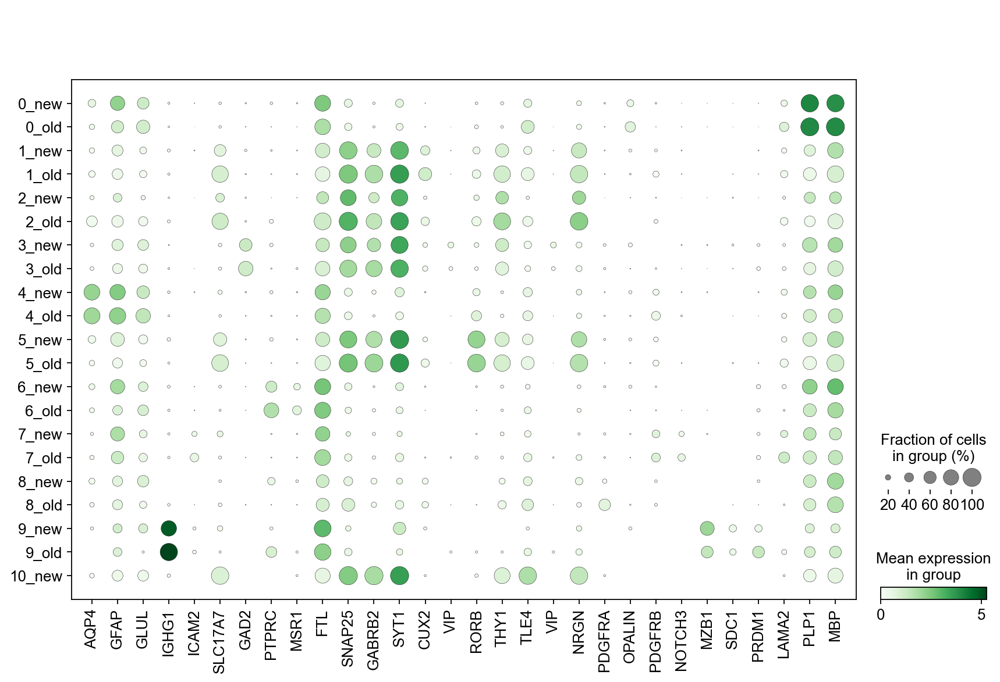

In [74]:
marker_genes = ["AQP4","GFAP","GLUL","IGHG1","ICAM2",
"SLC17A7","GAD2","PTPRC","MSR1","FTL","SNAP25",
"GABRB2","SYT1","CUX2","VIP","RORB","THY1",
"TLE4","VIP","NRGN","PDGFRA","OPALIN",
"PDGFRB","NOTCH3","MZB1","SDC1","PRDM1",
"LAMA2","PLP1","MBP"]
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes, color_map='Greens', save="new_old_leiden025.png", groupby='leiden_res0_25_new_old')

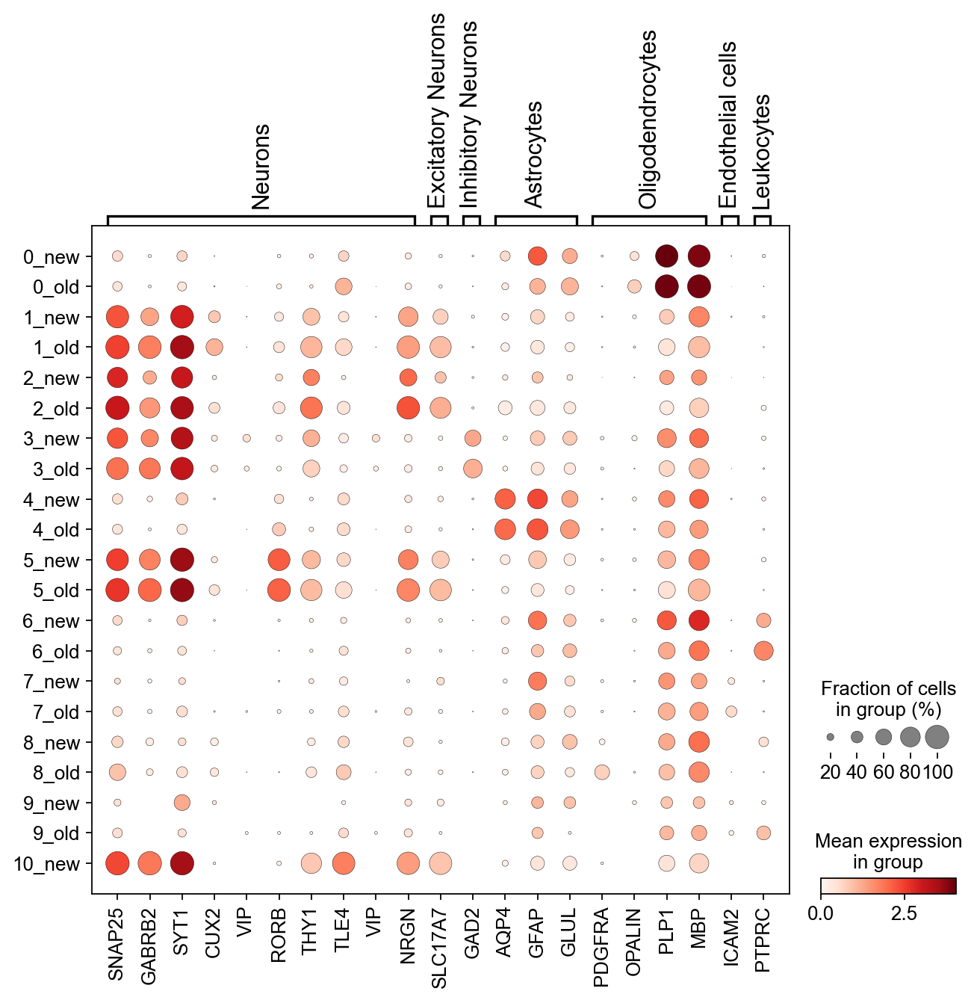

In [75]:
marker_genes_dict = {
    'Neurons': ["SNAP25", "GABRB2", "SYT1", "CUX2", "VIP", "RORB", "THY1", "TLE4", "VIP", "NRGN"],
    'Excitatory Neurons': ['SLC17A7'],
    'Inhibitory Neurons': ['GAD2'],
    'Astrocytes': ["AQP4", "GFAP", "GLUL"],
    'Oligodendrocytes': ["PDGFRA", "OPALIN", "PLP1", "MBP"],
    'Endothelial cells': "ICAM2",
    'Leukocytes': "PTPRC"
}
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes_dict,groupby='leiden_res0_25_new_old', save="leiden_new_old.png")

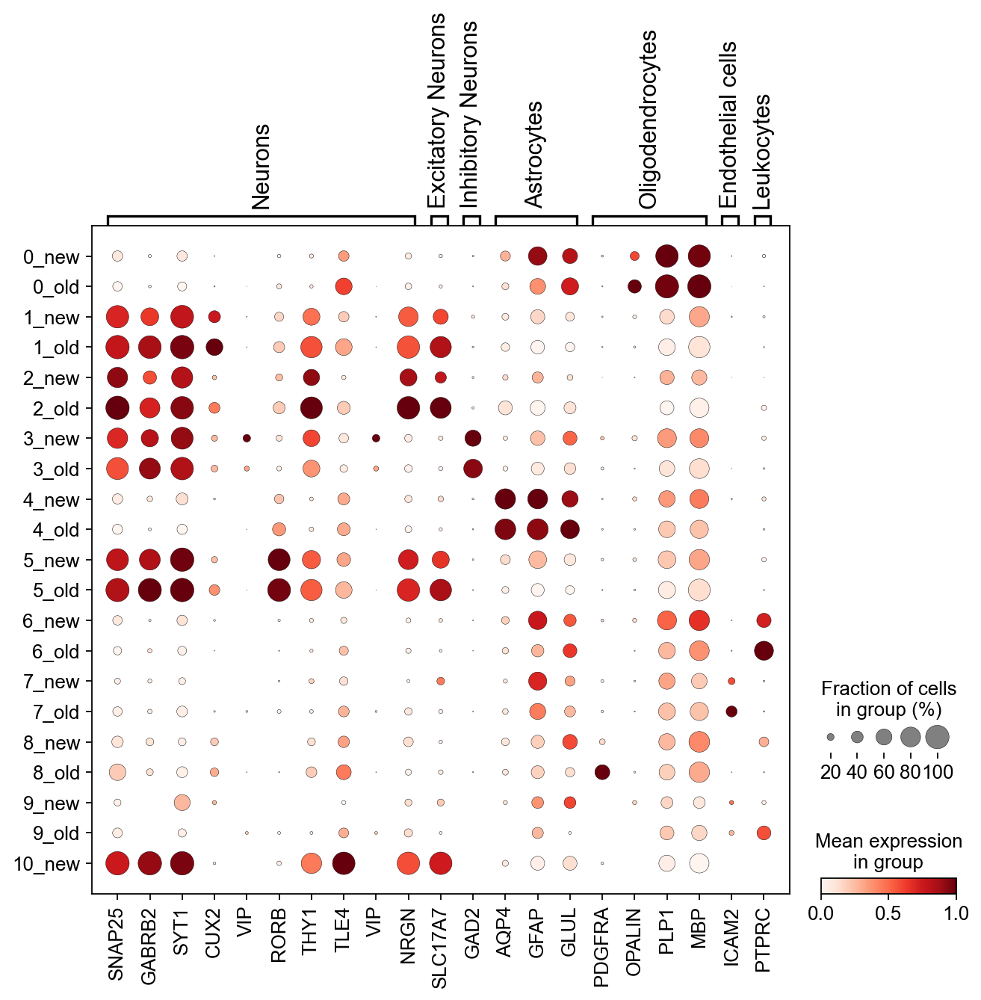

In [76]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_genes_dict,groupby='leiden_res0_25_new_old', standard_scale = "var",save="_scaled_leiden_new_old.png")

Show the ratio of newly recovered and old cells per cluster.

In [77]:
cell_counts = adata_donor_assigned_no_doublets.obs.groupby(["leiden_r0_25", "newold"]).size().reset_index(name="count")
cell_counts

,leiden_r0_25,newold,count
0,0,new,247
1,0,old,724
2,1,new,88
3,1,old,379
4,2,new,387
5,2,old,22
6,3,new,36
7,3,old,233
8,4,new,81
9,4,old,188


In [78]:
cell_counts_pivot = cell_counts.pivot(index="leiden_r0_25", columns="newold", values="count")
cell_counts_pivot

newold,new,old
leiden_r0_25,,
0,247,724
1,88,379
2,387,22
3,36,233
4,81,188
5,35,210
6,83,124
7,31,164
8,13,119


In [79]:
cell_counts_pivot["new_ratio"] = cell_counts_pivot["new"] / (cell_counts_pivot["new"] + cell_counts_pivot["old"])
cell_counts_pivot

newold,new,old,new_ratio
leiden_r0_25,,,
0,247,724,0.254377
1,88,379,0.188437
2,387,22,0.946210
3,36,233,0.133829
4,81,188,0.301115
5,35,210,0.142857
6,83,124,0.400966
7,31,164,0.158974
8,13,119,0.098485


In [80]:
new_ratio_df = cell_counts_pivot[["new_ratio"]].reset_index()

In [81]:
new_ratio_df

newold,leiden_r0_25,new_ratio
0,0,0.254377
1,1,0.188437
2,2,0.946210
3,3,0.133829
4,4,0.301115
5,5,0.142857
6,6,0.400966
7,7,0.158974
8,8,0.098485
9,9,0.384615


Plot the ratio as a bar plot.

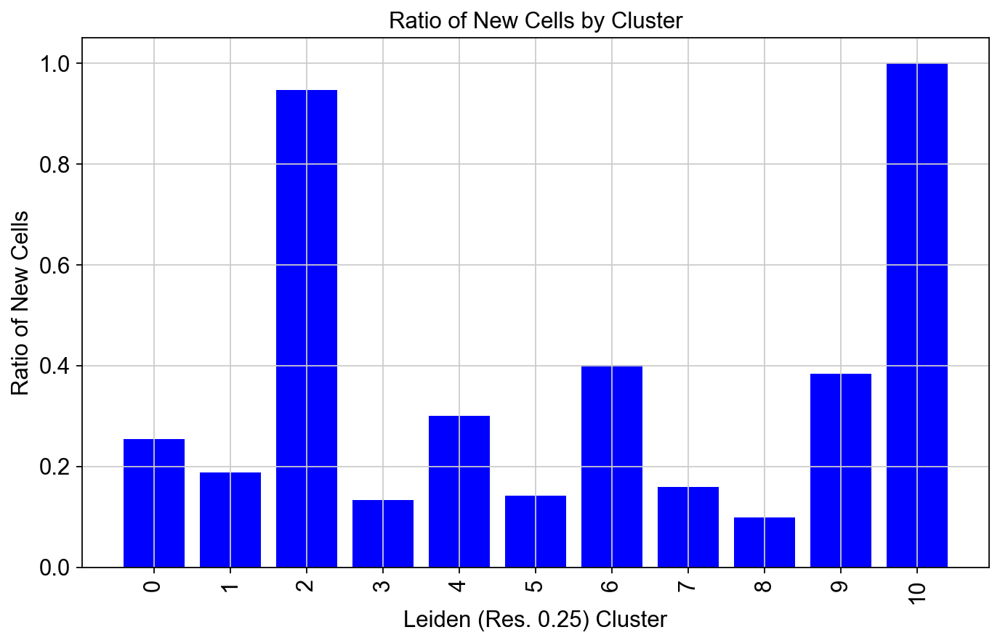

In [82]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.bar(x=new_ratio_df["leiden_r0_25"], height=new_ratio_df["new_ratio"], color="blue")

plt.title("Ratio of New Cells by Cluster")
plt.xlabel("Leiden (Res. 0.25) Cluster")
plt.ylabel("Ratio of New Cells")

plt.xticks(rotation=90)

plt.show()

Get the most prevalent cell type in each cluster, merge the most_prevalent_cell_type dataframe with the new_ratio_df dataframe and sort the merged dataframe based on most_prevalent_cell_type and cluster.

In [83]:
most_prevalent_cell_type = adata_donor_assigned_no_doublets.obs.groupby("leiden_r0_25")["bucket"].agg(lambda x:x.value_counts().index[0]).reset_index()
most_prevalent_cell_type.columns = ["leiden_r0_25", "most_prevalent_cell_type"]

new_ratio_df_merged = new_ratio_df.merge(most_prevalent_cell_type, on="leiden_r0_25")

new_ratio_df_sorted = new_ratio_df_merged.sort_values(by=["most_prevalent_cell_type", "leiden_r0_25"])
new_ratio_df_sorted

,leiden_r0_25,new_ratio,most_prevalent_cell_type
4,4,0.301115,astrocytes
10,10,1.000000,astrocytes
6,6,0.400966,cd74
9,9,0.384615,cd74
7,7,0.158974,endothelial
1,1,0.188437,neurons
2,2,0.946210,neurons
3,3,0.133829,neurons
5,5,0.142857,neurons
0,0,0.254377,oligodendrocytes


Change Cluster 11 to neurons as this is just an artifact bc of completely new cells, then order by name in alphabetical order.

In [84]:
new_ratio_df_sorted.iloc[1, 2] = "neurons"

In [85]:
new_ratio_df_sorted

,leiden_r0_25,new_ratio,most_prevalent_cell_type
4,4,0.301115,astrocytes
10,10,1.000000,neurons
6,6,0.400966,cd74
9,9,0.384615,cd74
7,7,0.158974,endothelial
1,1,0.188437,neurons
2,2,0.946210,neurons
3,3,0.133829,neurons
5,5,0.142857,neurons
0,0,0.254377,oligodendrocytes


In [86]:
new_ratio_df_sorted = new_ratio_df_sorted.sort_values(by=["most_prevalent_cell_type", "leiden_r0_25"])
new_ratio_df_sorted

,leiden_r0_25,new_ratio,most_prevalent_cell_type
4,4,0.301115,astrocytes
6,6,0.400966,cd74
9,9,0.384615,cd74
7,7,0.158974,endothelial
1,1,0.188437,neurons
2,2,0.946210,neurons
3,3,0.133829,neurons
5,5,0.142857,neurons
10,10,1.000000,neurons
0,0,0.254377,oligodendrocytes


Replot the ratio with old cells colored as well and an adjusted color scheme.

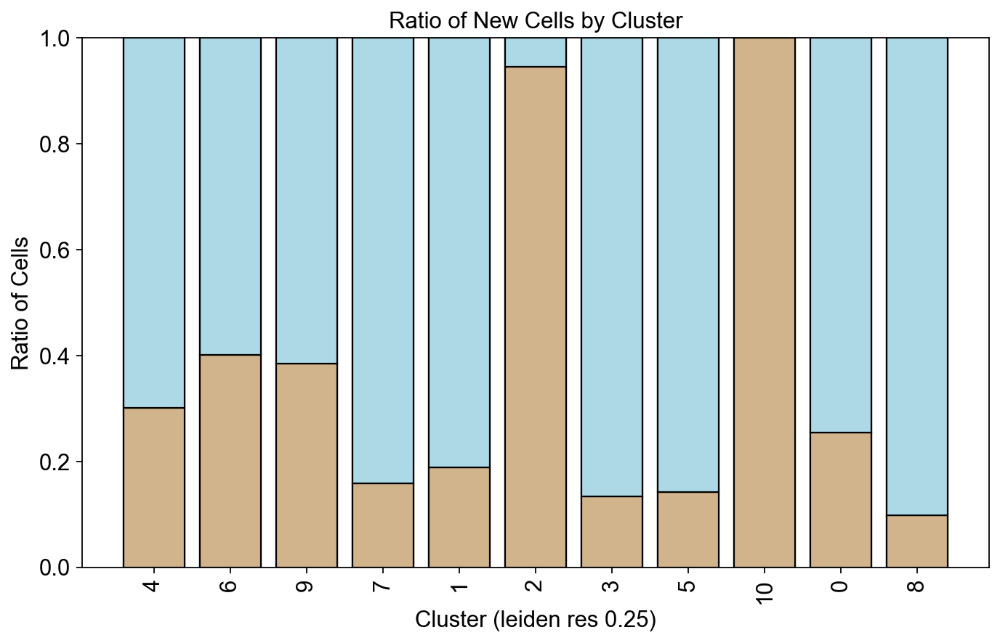

In [87]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
colors = ["#D2B48C", "#ADD8E6"]

plt.bar(x=new_ratio_df_sorted["leiden_r0_25"], height=1, color="#D2B48C", edgecolor="black")
plt.bar(x=new_ratio_df_sorted["leiden_r0_25"], height=new_ratio_df_sorted["new_ratio"], color=colors[0], edgecolor="black")

bottom = new_ratio_df_sorted["new_ratio"]
plt.bar(x=new_ratio_df_sorted["leiden_r0_25"], height=1-new_ratio_df_sorted["new_ratio"], bottom=bottom, color="#ADD8E6", edgecolor="black")

plt.title("Ratio of New Cells by Cluster")
plt.xlabel("Cluster (leiden res 0.25)")
plt.ylabel("Ratio of Cells")

plt.xticks(rotation=90)

plt.grid(False)
plt.savefig("ratio_of_new_cells.png")

plt.show()

Ranking genes by new and old clusters for a spearman's rank correlation analysis.

In [88]:
sc.tl.rank_genes_groups(adata_donor_assigned_no_doublets, groupby='leiden_res0_25_new_old', method='wilcoxon')

ranking genes
    finished (0:00:11)


/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/fabiola.curion/Documents/devel/miniconda

In [89]:
adata_donor_assigned_no_doublets.uns['rank_genes_groups']

{'params': {'groupby': 'leiden_res0_25_new_old',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('PLP1', 'ST18', 'MEG3', 'CBLN2', 'MAP1B', 'SEZ6L2', 'GAD1', 'CNTNAP2', 'AQP4', 'DTNA', 'RORB', 'RORB', 'SPP1', 'DOCK8', 'VWF', 'EPAS1', 'VCAN', 'PCDH15', 'IGHG3', 'IGHG1', 'HTR2C'),
            ('MBP', 'CTNNA3', 'KCNIP4', 'MEG3', 'SNAP25', 'SNAP25', 'GAD2', 'GRIK2', 'CLU', 'PITPNC1', 'ZNF385B', 'CNTN5', 'SLCO2B1', 'PLXDC2', 'FLT1', 'FLT1', 'SOX6', 'PTPRZ1', 'B2M', 'XBP1', 'ASIC2'),
            ('CNP', 'CLDN11', 'LRRTM4', 'MIR137HG', 'CALM1', 'TAGLN3', 'SYNPR', 'GAD1', 'ATP1A2', 'SLC1A2', 'KCNQ5', 'RALYL', 'PLXDC2', 'APBB1IP', 'VIM', 'CLDN5', 'ZNF608', 'TNR', 'IGHGP', 'IGHG4', 'KIAA1456'),
            ...,
            ('MEF2C', 'MEF2C', 'ZBTB20', 'QKI', 'FMNL2', 'MBP', 'CACNA2D1', 'ARAP2', 'SLC24A2', 'IL1RAPL1', 'NFIA', 'FTH1', 'ANKS1B', 'MAGI2', 'LSAMP', 'CADM2', 'ZDHHC20', 'ATP1B1', 'CADM2', 'R

In [90]:
adata_donor_assigned_no_doublets.uns['rank_genes_groups'].keys()
adata_donor_assigned_no_doublets.uns['rank_genes_groups']["names"]['0_old']


array(['ST18', 'CTNNA3', 'CLDN11', ..., 'MEF2C', 'GPM6A', 'CELF2'],
      dtype=object)

In [91]:
adata_donor_assigned_no_doublets.uns['rank_genes_groups']["names"]['0_new']

array(['PLP1', 'MBP', 'CNP', ..., 'MEF2C', 'NRXN1', 'FRMD4A'],
      dtype=object)

In [92]:
# Extract the DE genes for each cluster
cluster_names = adata_donor_assigned_no_doublets.obs['leiden_res0_25_new_old'].unique()

all_de_genes = pd.DataFrame()

for cluster_name in cluster_names:
    gene_names = adata_donor_assigned_no_doublets.uns['rank_genes_groups']['names'][cluster_name]
    all_de_genes[cluster_name] = gene_names

In [93]:
all_de_genes.columns

Index(['1_old', '0_old', '2_new', '4_new', '5_old', '6_old', '2_old', '3_old',
       '4_old', '5_new', '8_old', '0_new', '7_old', '7_new', '9_old', '6_new',
       '1_new', '9_new', '3_new', '10_new', '8_new'],
      dtype='object')

In [94]:
all_de_genes

,1_old,0_old,2_new,4_new,5_old,6_old,2_old,3_old,4_old,5_new,...,0_new,7_old,7_new,9_old,6_new,1_new,9_new,3_new,10_new,8_new
0,CBLN2,ST18,MAP1B,AQP4,RORB,DOCK8,SEZ6L2,CNTNAP2,DTNA,RORB,...,PLP1,EPAS1,VWF,IGHG1,SPP1,MEG3,IGHG3,GAD1,HTR2C,VCAN
1,MEG3,CTNNA3,SNAP25,CLU,CNTN5,PLXDC2,SNAP25,GRIK2,PITPNC1,ZNF385B,...,MBP,FLT1,FLT1,XBP1,SLCO2B1,KCNIP4,B2M,GAD2,ASIC2,SOX6
2,MIR137HG,CLDN11,CALM1,ATP1A2,RALYL,APBB1IP,TAGLN3,GAD1,SLC1A2,KCNQ5,...,CNP,CLDN5,VIM,IGHG4,PLXDC2,LRRTM4,IGHGP,SYNPR,KIAA1456,ZNF608
3,KCNIP4,SLC44A1,MT-CO3,SLC1A2,PTPRT,C10orf11,NRGN,RP11-123O10.4,SORBS1,CNTN5,...,CRYAB,BSG,CLDN5,IGHG3,APBB1IP,CBLN2,TXNRD1,GRIN2B,CRYM,TNR
4,LRRTM4,RNF220,CHN1,ITPKB,SLC22A10,DOCK2,CAMK2B,GRIK1,MSI2,PTPRT,...,FTH1,ATP10A,TMSB4X,MTDH,CHST11,CSMD1,IGHG1,SYT1,ZNF385D,SEMA5A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25493,MBP,NRG3,WWOX,PEX5L,DOCK10,CADM2,ZBTB20,MBNL2,PTPRD,ZEB2,...,OXR1,NCAM1,NCAM2,MAGI2,PCDH9,WWOX,KIF1B,LINC-PINT,MBP,ACTN4
25494,PLP1,KCNMA1,TCF12,NRXN3,PLP1,PTPRD,CH507-513H4.1,GPM6B,ELMO1,ZBTB20,...,PLCB1,PPP2R2B,CADM2,PCDH9,KIF1B,TMTC2,PTPRD,TJP1,ZEB2,LIMCH1
25495,QKI,MEF2C,FMNL2,SLC24A2,FTH1,MAGI2,MBP,ARAP2,IL1RAPL1,NFIA,...,MEF2C,CADM2,LSAMP,RTN4,ANKS1B,ZBTB20,CADM2,CACNA2D1,ELMO1,ZDHHC20
25496,FTH1,GPM6A,ZBTB20,ANKS1B,NFIA,NCAM1,PLP1,PTPRK,SLC24A2,ERBB2IP,...,NRXN1,ANK2,DLG2,ANKS1B,DLG2,QKI,GTF2I,MBNL2,PTPRK,NECAB1


In [95]:
mm =[str(i) for i in range(0, 10) ]
id1 = [x + '_new' for x in mm ]
id2 = [x + '_old' for x in mm ]
idx= id1 + id2
idx
de_genes = all_de_genes[idx]
de_genes

,0_new,1_new,2_new,3_new,4_new,5_new,6_new,7_new,8_new,9_new,0_old,1_old,2_old,3_old,4_old,5_old,6_old,7_old,8_old,9_old
0,PLP1,MEG3,MAP1B,GAD1,AQP4,RORB,SPP1,VWF,VCAN,IGHG3,ST18,CBLN2,SEZ6L2,CNTNAP2,DTNA,RORB,DOCK8,EPAS1,PCDH15,IGHG1
1,MBP,KCNIP4,SNAP25,GAD2,CLU,ZNF385B,SLCO2B1,FLT1,SOX6,B2M,CTNNA3,MEG3,SNAP25,GRIK2,PITPNC1,CNTN5,PLXDC2,FLT1,PTPRZ1,XBP1
2,CNP,LRRTM4,CALM1,SYNPR,ATP1A2,KCNQ5,PLXDC2,VIM,ZNF608,IGHGP,CLDN11,MIR137HG,TAGLN3,GAD1,SLC1A2,RALYL,APBB1IP,CLDN5,TNR,IGHG4
3,CRYAB,CBLN2,MT-CO3,GRIN2B,SLC1A2,CNTN5,APBB1IP,CLDN5,TNR,TXNRD1,SLC44A1,KCNIP4,NRGN,RP11-123O10.4,SORBS1,PTPRT,C10orf11,BSG,VCAN,IGHG3
4,FTH1,CSMD1,CHN1,SYT1,ITPKB,PTPRT,CHST11,TMSB4X,SEMA5A,IGHG1,RNF220,LRRTM4,CAMK2B,GRIK1,MSI2,SLC22A10,DOCK2,ATP10A,LHFPL3,MTDH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25493,OXR1,WWOX,WWOX,LINC-PINT,PEX5L,ZEB2,PCDH9,NCAM2,ACTN4,KIF1B,NRG3,MBP,ZBTB20,MBNL2,PTPRD,DOCK10,CADM2,NCAM1,SHTN1,MAGI2
25494,PLCB1,TMTC2,TCF12,TJP1,NRXN3,ZBTB20,KIF1B,CADM2,LIMCH1,PTPRD,KCNMA1,PLP1,CH507-513H4.1,GPM6B,ELMO1,PLP1,PTPRD,PPP2R2B,MAP7,PCDH9
25495,MEF2C,ZBTB20,FMNL2,CACNA2D1,SLC24A2,NFIA,ANKS1B,LSAMP,ZDHHC20,CADM2,MEF2C,QKI,MBP,ARAP2,IL1RAPL1,FTH1,MAGI2,CADM2,ATP1B1,RTN4
25496,NRXN1,QKI,ZBTB20,MBNL2,ANKS1B,ERBB2IP,DLG2,DLG2,NECAB1,GTF2I,GPM6A,FTH1,PLP1,PTPRK,SLC24A2,NFIA,NCAM1,ANK2,LIMCH1,ANKS1B


In [96]:
from scipy.stats import spearmanr
dict_results_01 = {}
for c in idx:
    for a in idx:
        result = spearmanr(de_genes[c][0:100], de_genes[a][0:100])
        dict_results_01[c + ":" + a] = result


In [97]:
mm =[str(i) for i in range(0, 10) ]
ids=[x + '_new:'+ x +"_old" for x in mm ]

In [98]:

values = [dict_results_01[name] for name in ids]
values

[SpearmanrResult(correlation=0.2261146114611461, pvalue=0.023691221832346048),
 SpearmanrResult(correlation=0.009468946894689469, pvalue=0.9255054985690474),
 SpearmanrResult(correlation=0.02879087908790879, pvalue=0.7761436963084264),
 SpearmanrResult(correlation=-0.0063006300630063005, pvalue=0.9503918053047676),
 SpearmanrResult(correlation=-0.04319231923192318, pvalue=0.6696036279812847),
 SpearmanrResult(correlation=0.07983198319831981, pvalue=0.4297939782929999),
 SpearmanrResult(correlation=-0.058613861386138603, pvalue=0.56240851020363),
 SpearmanrResult(correlation=-0.012637263726372637, pvalue=0.9006907637993539),
 SpearmanrResult(correlation=0.01602160216021602, pvalue=0.8742898680579365),
 SpearmanrResult(correlation=0.16787278727872784, pvalue=0.09501986499293899)]

Plot a density plot of doublet scores of cells detected by hadge in the adata after standard QC.

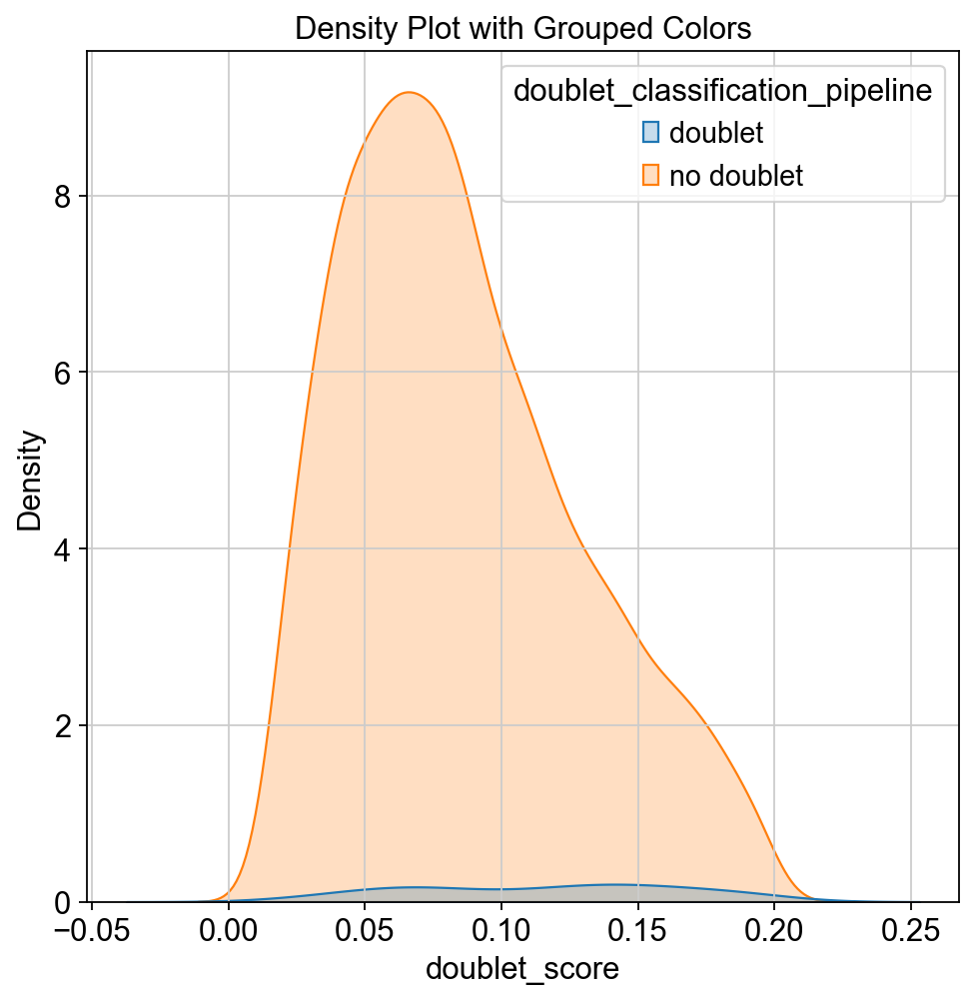

In [99]:
import seaborn as sns

numeric_column = 'doublet_score'
group_column = 'doublet_classification_pipeline'

numeric_values = adata.obs[numeric_column]
group_labels = adata.obs[group_column]

df = pd.DataFrame({numeric_column: numeric_values, group_column: group_labels})

sns.kdeplot(data=df, x=numeric_column, hue=group_column, fill=True)

plt.xlabel(numeric_column)
plt.ylabel('Density')
plt.title('Density Plot with Grouped Colors')

plt.show()

lot a density plot of doublet scores of cells grouped by new and old cells.

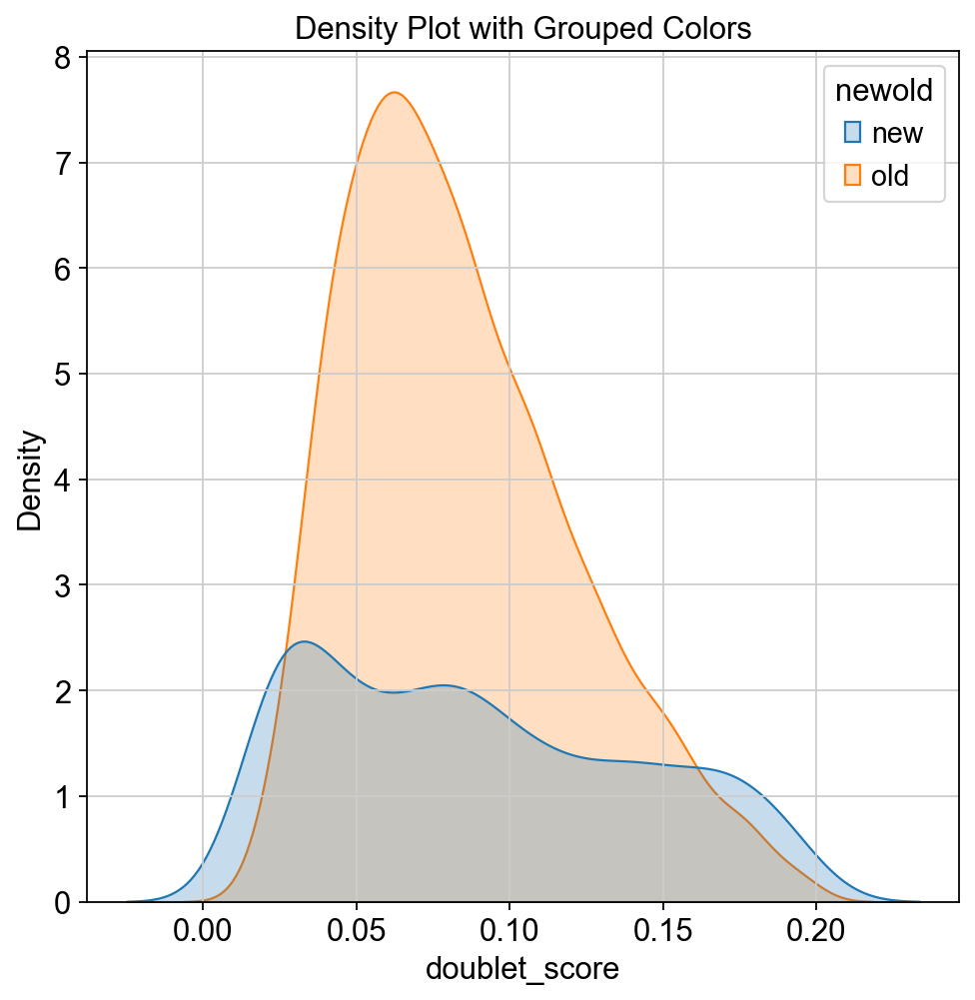

In [100]:
numeric_column = 'doublet_score'
group_column = 'newold'

numeric_values = adata_donor_assigned_no_doublets.obs[numeric_column]
group_labels = adata_donor_assigned_no_doublets.obs[group_column]

df = pd.DataFrame({numeric_column: numeric_values, group_column: group_labels})

sns.kdeplot(data=df, x=numeric_column, hue=group_column, fill=True)

plt.xlabel(numeric_column)
plt.ylabel('Density')
plt.title('Density Plot with Grouped Colors')

plt.show()

Rank genes, extract logFC values and show these logFC values as scatter plots comparing old and newly recovered cells in the same cluster.

In [101]:
adata_old = adata_donor_assigned_no_doublets[(adata_donor_assigned_no_doublets.obs['newold'] == "old"), :]
adata_new = adata_donor_assigned_no_doublets[(adata_donor_assigned_no_doublets.obs['newold'] == "new"), :]

sc.tl.rank_genes_groups(adata_new, groupby='leiden_res0_25_new_old')
results_new = adata_new.uns['rank_genes_groups']

sc.tl.rank_genes_groups(adata_old, groupby='leiden_res0_25_new_old')
results_old = adata_old.uns['rank_genes_groups']

logFC_values_new = pd.DataFrame(results_new['logfoldchanges'])
gene_names_new = pd.DataFrame(results_new['names'])
pvalues_new = pd.DataFrame(results_new['pvals'])
logFC_values_old = pd.DataFrame(results_old['logfoldchanges'])
gene_names_old = pd.DataFrame(results_old['names'])
pvalues_old = pd.DataFrame(results_old['pvals'])

ranking genes


/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished (0:00:00)
ranking genes


/Users/fabiola.curion/Documents/devel/miniconda3/envs/panpipes_py39/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished (0:00:01)


In [102]:
new_gene_fc = {}
for i in id1:
    df = pd.DataFrame({"gene":gene_names_new[i],"logFC_new": logFC_values_new[i], "pvalues_new": pvalues_new[i]})
    #df.set_index("gene", inplace=True)
    new_gene_fc[i] = df

old_gene_fc = {}
for i in id2:
    df = pd.DataFrame({"gene":gene_names_old[i],"logFC_old": logFC_values_old[i], "pvalues_old": pvalues_old[i]})
    #df.set_index("gene", inplace=True)
    old_gene_fc[i] = df




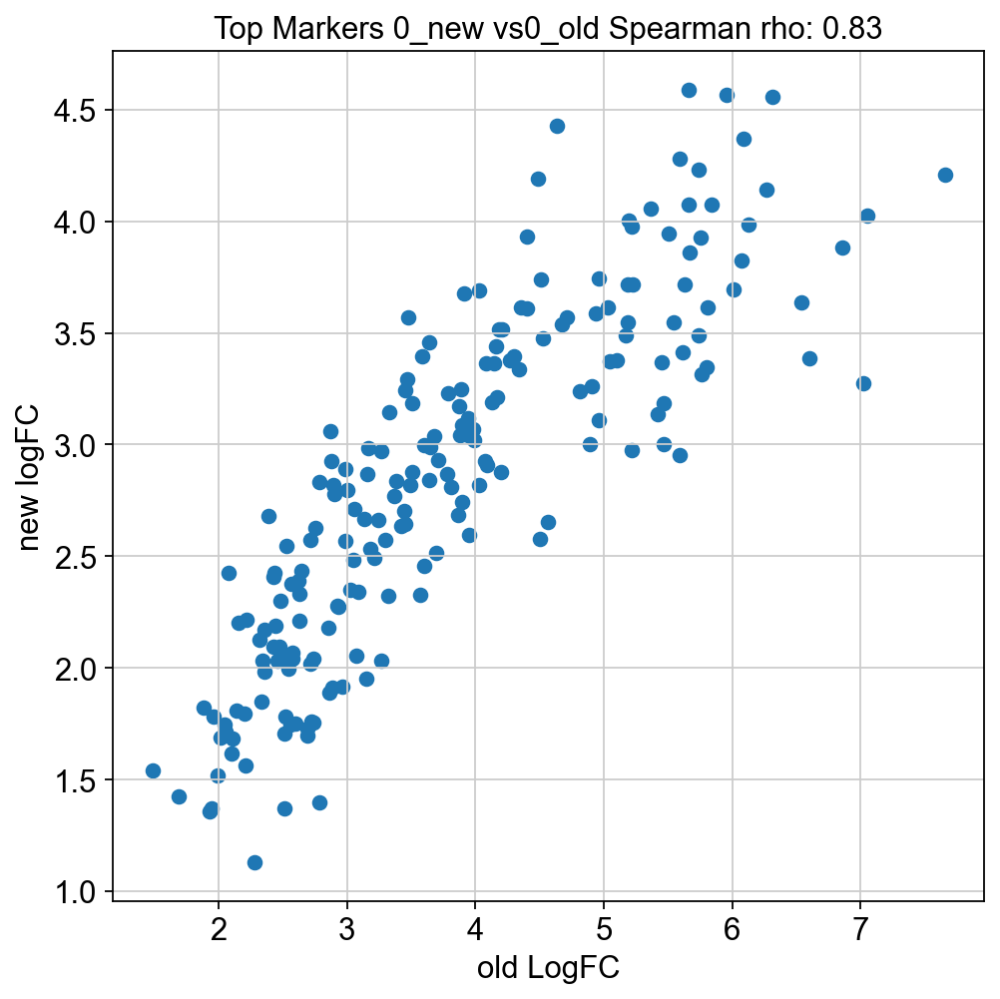

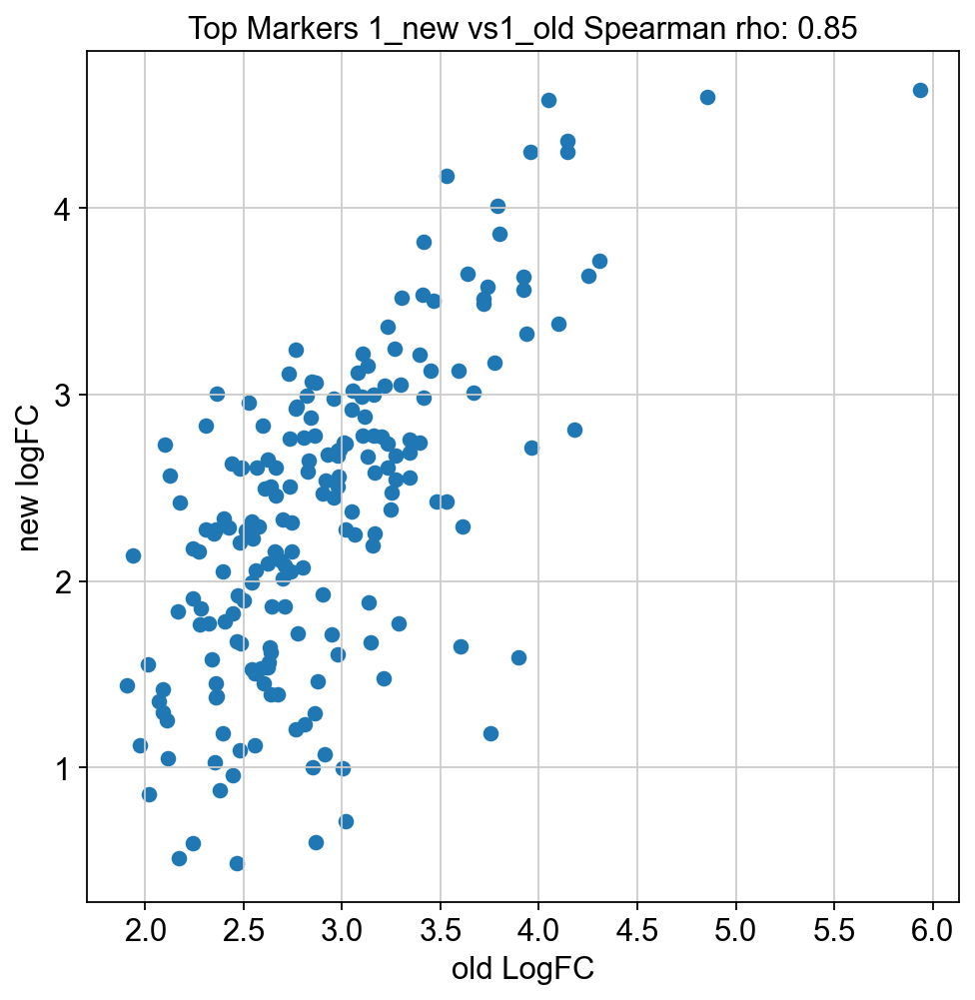

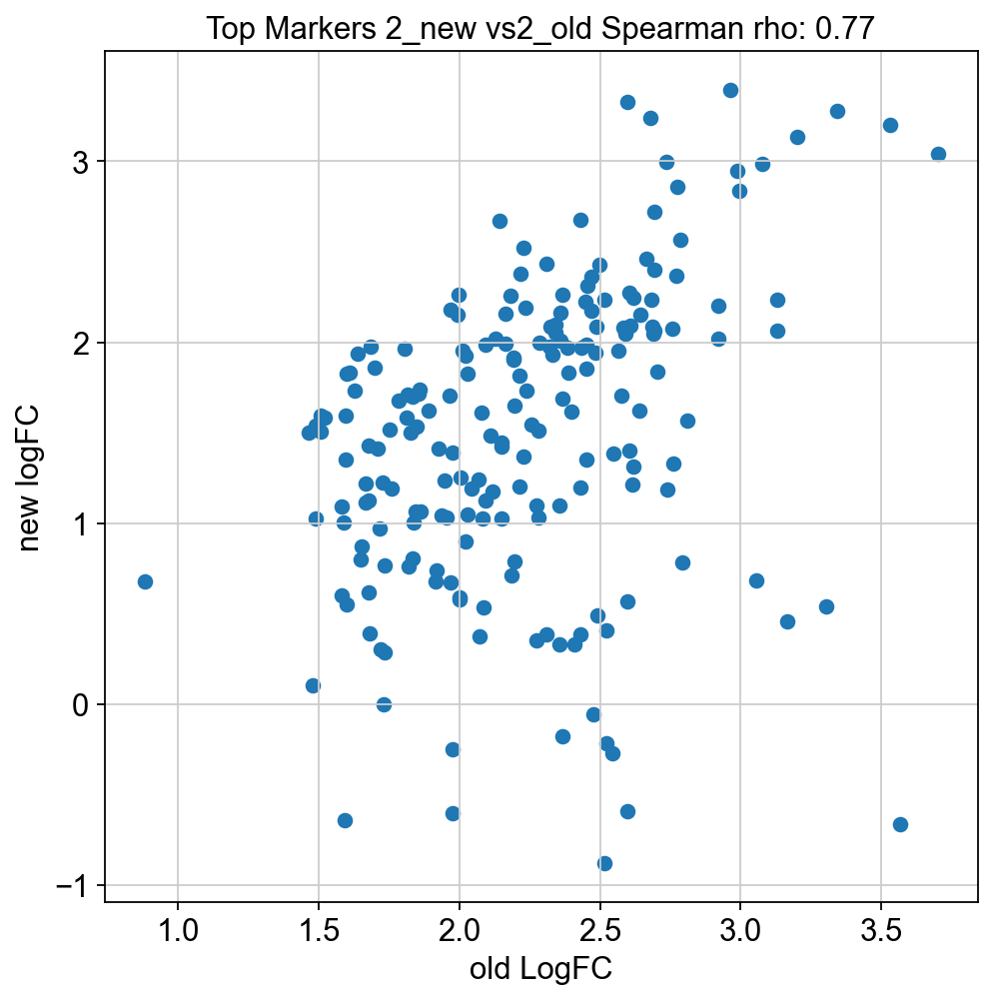

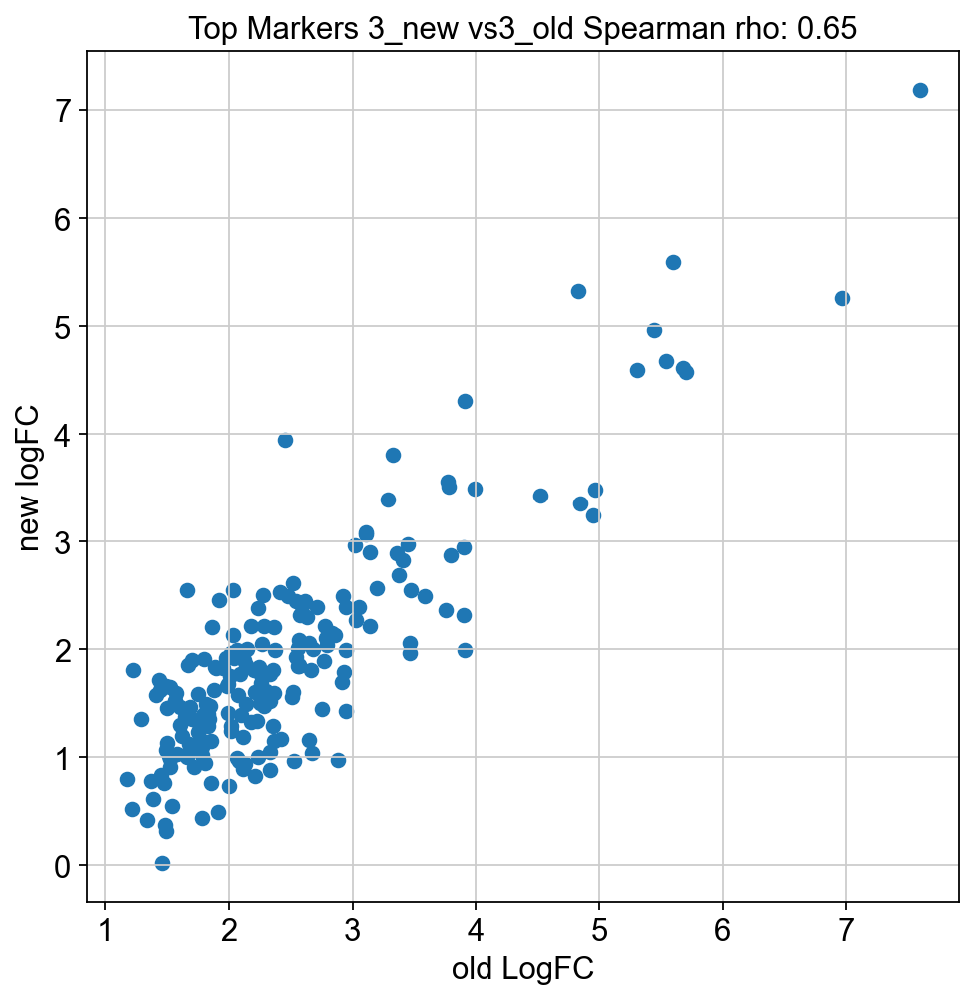

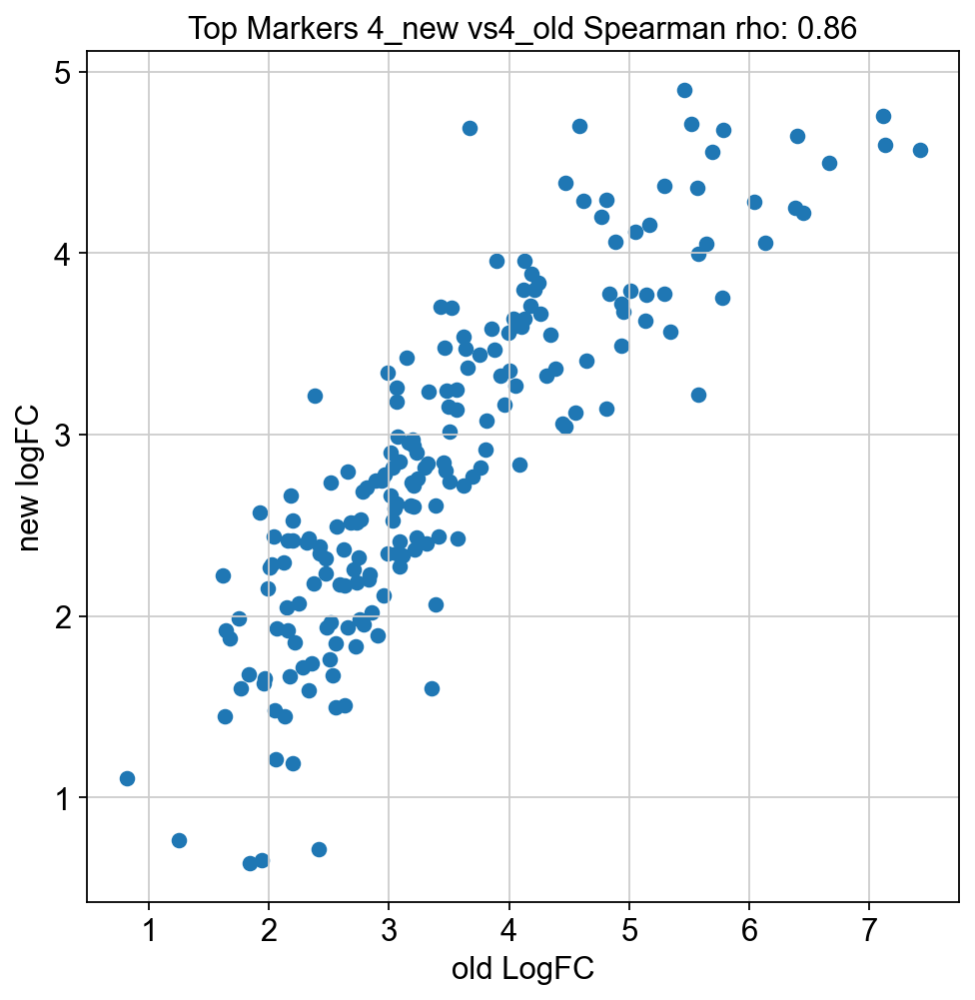

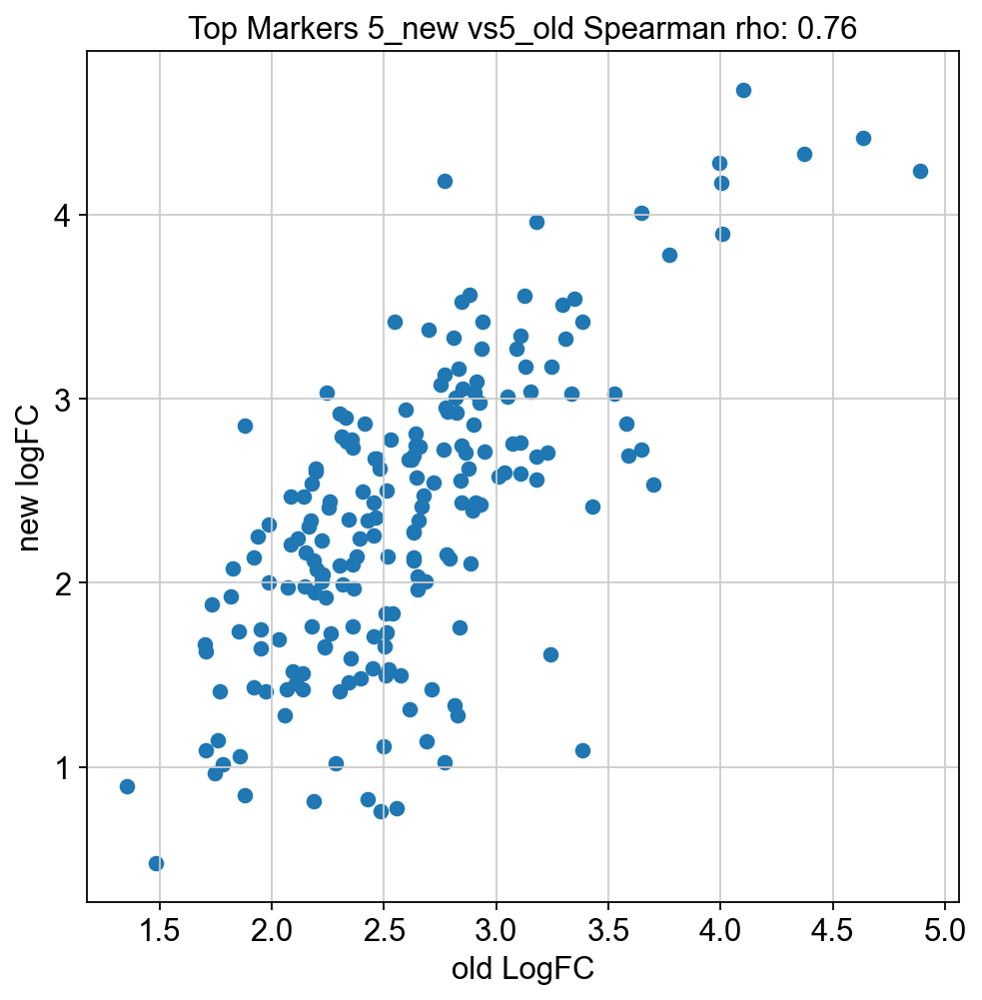

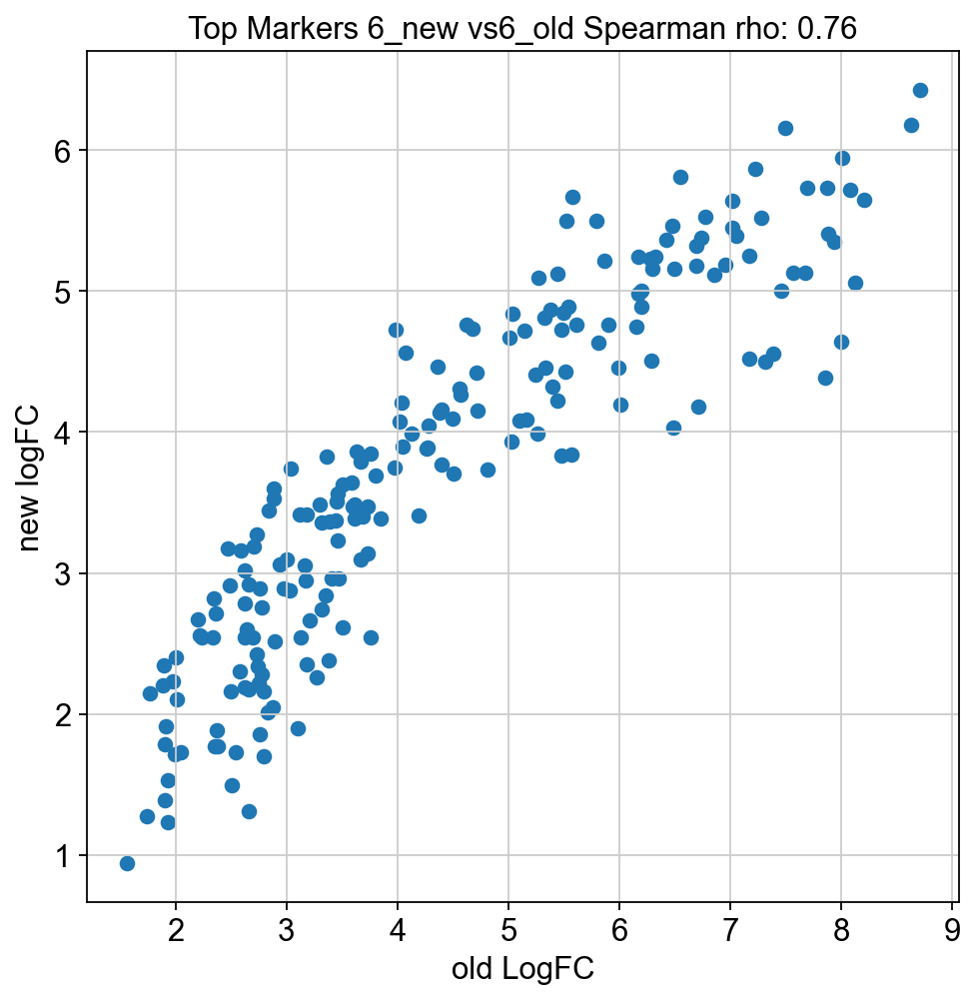

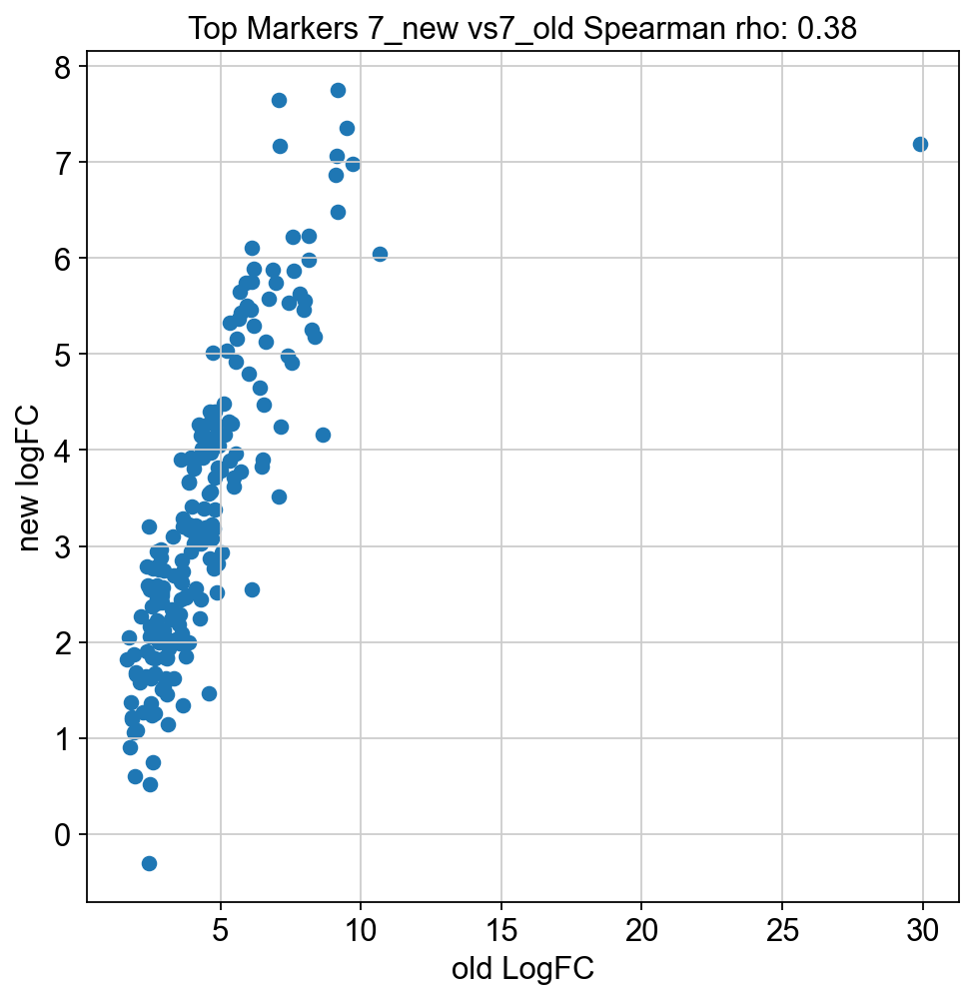

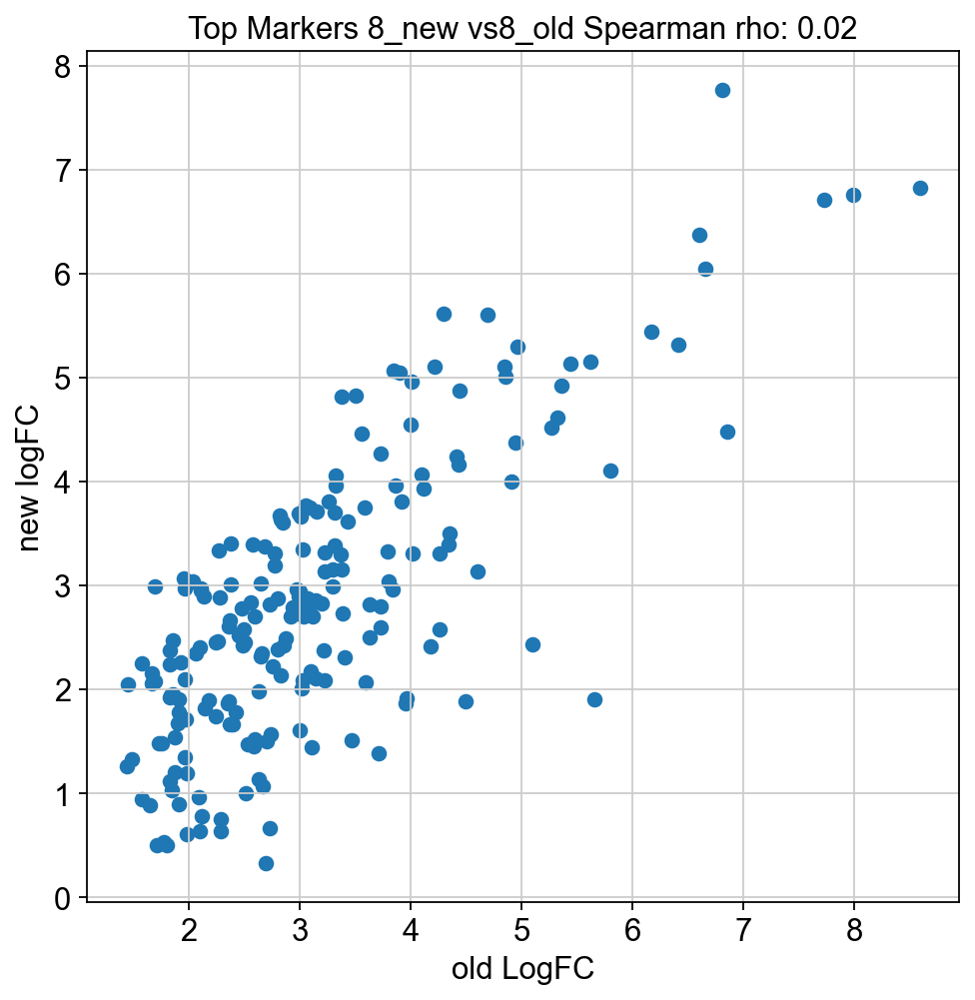

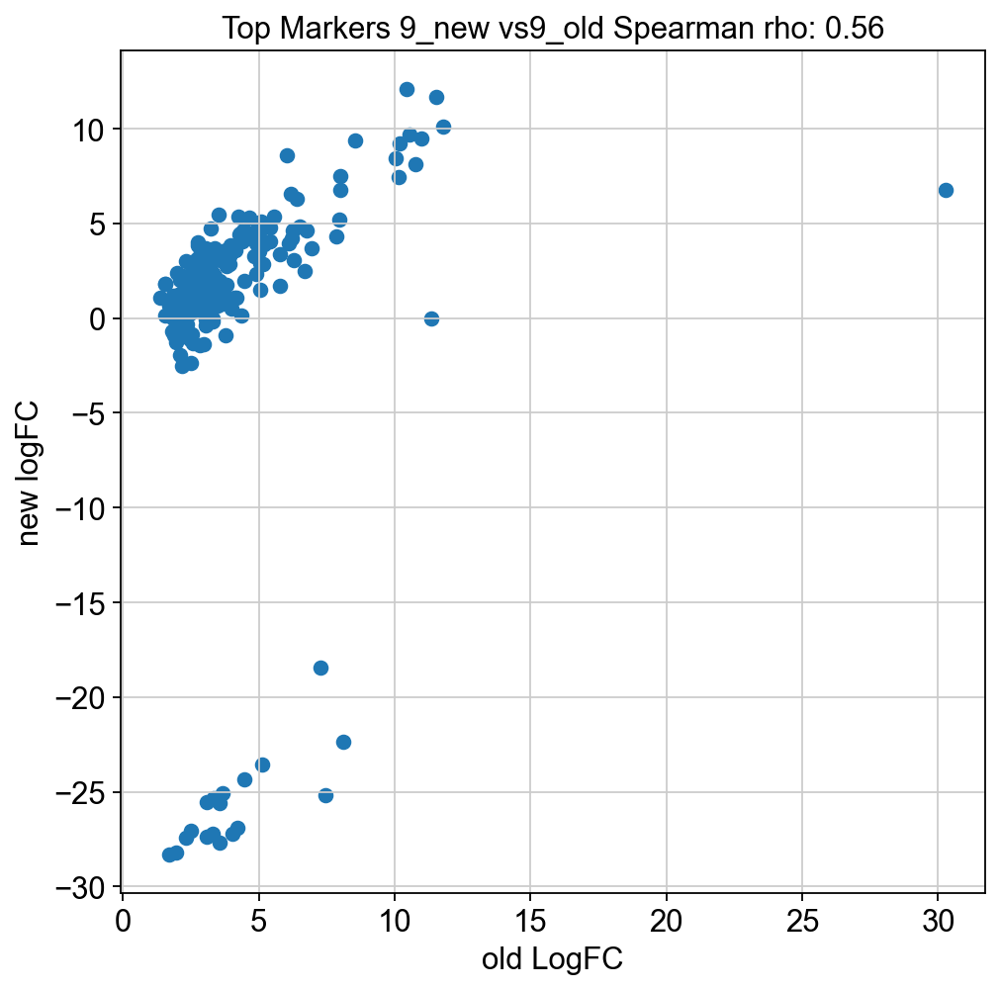

In [103]:

for i in mm:
    ddf=pd.merge(old_gene_fc[i+"_old"],new_gene_fc[i+"_new"], on="gene") 
    s_ddf = ddf[(ddf["pvalues_old"]<=0.05) & (ddf["pvalues_new"]<=0.05)]

    result = spearmanr(s_ddf["logFC_old"],s_ddf["logFC_new"])

    plt.scatter(x = "logFC_old", y="logFC_new", data= ddf.head(200))
    plt.xlabel('old LogFC')
    plt.ylabel('new logFC')
    plt.title("Top Markers "+ i + "_new vs" + i+"_old" + " Spearman rho: " + str(round(result[0],2)))
    plt.savefig("TopMarkers"+ i + "_new vs" + i+"_old.png")
    plt.show()





In [104]:
marker_listoflists = [
    ['AQP4', 'Astrocytes'],
    ['GFAP', 'Astrocytes'],
    ['GLUL', 'Astrocytes'],
    ['SNAP25', 'Neurons'],
    ['GABRB2', 'Neurons'],
    ['SYT1', 'Neurons'],
    ['NRGN', 'Neurons'],
    ['SLC17A7', 'Excitatory neurons'],
    ['GAD2', 'Inhibitory neurons'],
    ['OPALIN', 'Oligodendrocytes'],
    ['PLP1', 'Oligodendrocytes'],
    ['MBP', 'Oligodendrocytes'],
    ['PTPRC', 'Leukocytes'],
    ['IGHG1', 'B-cells'],
    ['MZB1', 'Plasma cells'],
    ['MSR1', 'Macrophages'],
    ['FTL', 'Microglia'],
    ['ICAM2', 'Endothelial cells'],
    ['LAMA2', 'Stromal cells']
]

marker_frame = pd.DataFrame(marker_listoflists, columns=['Marker', 'Cell Type'])

marker_dict = {}
for marker, cell in marker_listoflists:
    if cell not in marker_dict:
        marker_dict[cell] = []
    marker_dict[cell].append(marker)

print(marker_dict)

marker_frame.set_index('Marker', inplace=True)
marker_frame

{'Astrocytes': ['AQP4', 'GFAP', 'GLUL'], 'Neurons': ['SNAP25', 'GABRB2', 'SYT1', 'NRGN'], 'Excitatory neurons': ['SLC17A7'], 'Inhibitory neurons': ['GAD2'], 'Oligodendrocytes': ['OPALIN', 'PLP1', 'MBP'], 'Leukocytes': ['PTPRC'], 'B-cells': ['IGHG1'], 'Plasma cells': ['MZB1'], 'Macrophages': ['MSR1'], 'Microglia': ['FTL'], 'Endothelial cells': ['ICAM2'], 'Stromal cells': ['LAMA2']}


,Cell Type
Marker,
AQP4,Astrocytes
GFAP,Astrocytes
GLUL,Astrocytes
SNAP25,Neurons
GABRB2,Neurons
SYT1,Neurons
NRGN,Neurons
SLC17A7,Excitatory neurons
GAD2,Inhibitory neurons


Plot dotplots with a new arrangement of marker genes in different leiden resolutions and a more thorough leukocyte subsetting.

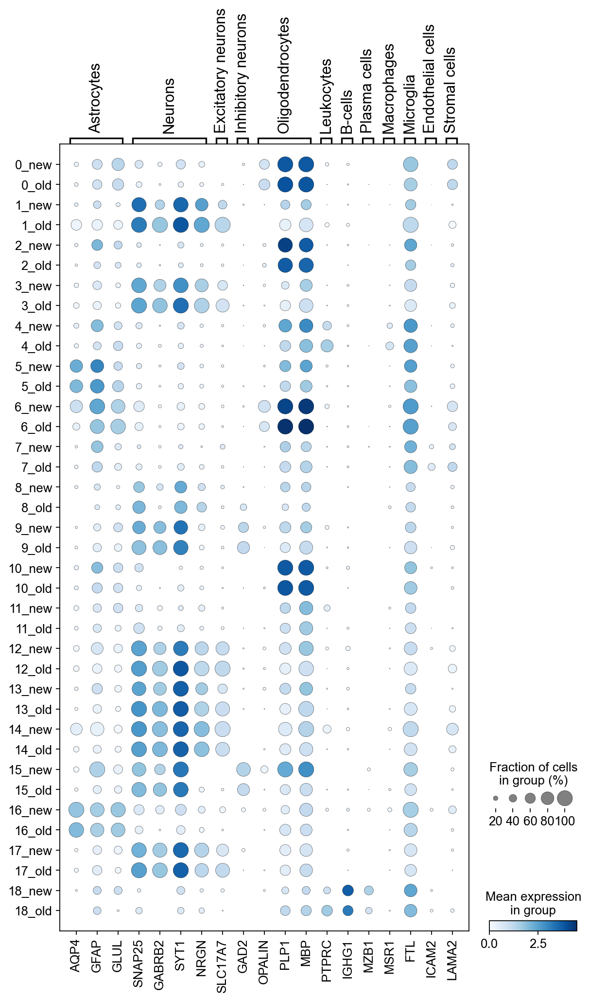

In [105]:
marker_genes = ['AQP4', 'GFAP', 'GLUL', 'SNAP25', 'GABRB2', 'SYT1',
                'NRGN', 'SLC17A7', 'GAD2', 'OPALIN', 'PLP1', 'MBP',
                'PTPRC', 'IGHG1',
                'MZB1', 'MSR1', 'FTL', 'ICAM2',
                'LAMA2']

sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_dict, color_map='Blues', groupby='leiden_new_old')

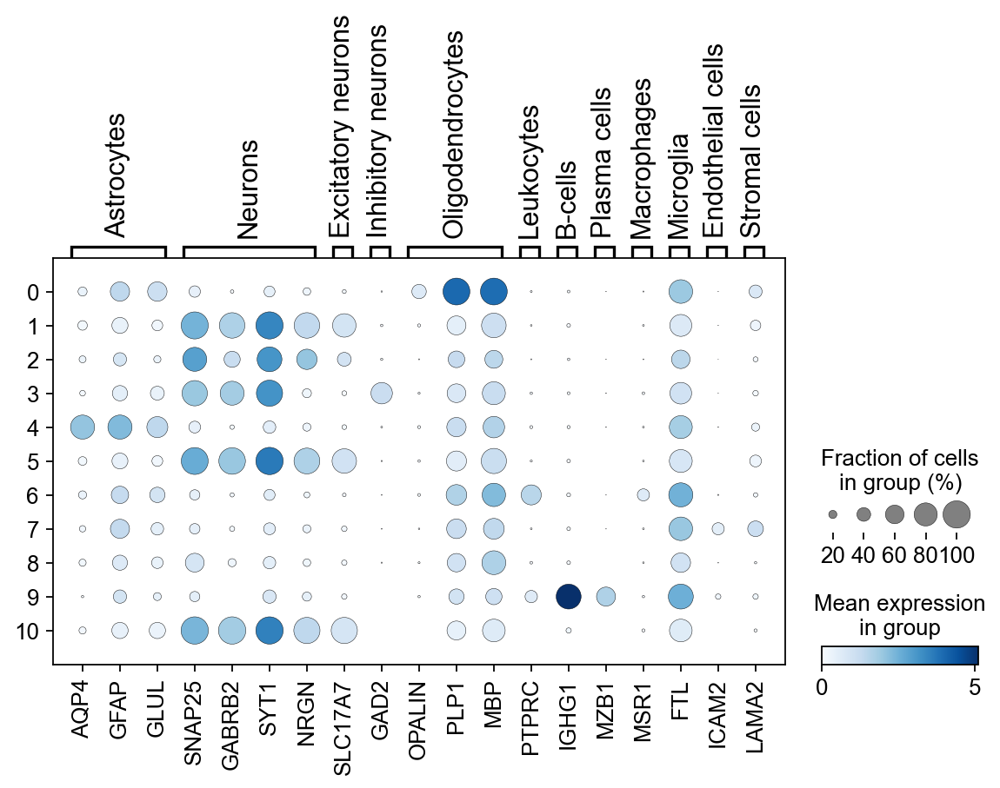

In [106]:
sc.pl.dotplot(adata_donor_assigned_no_doublets, marker_dict, color_map='Blues', groupby='leiden_r0_25')

Showing CD74 expression next to new and old cells plotted in a UMAP.

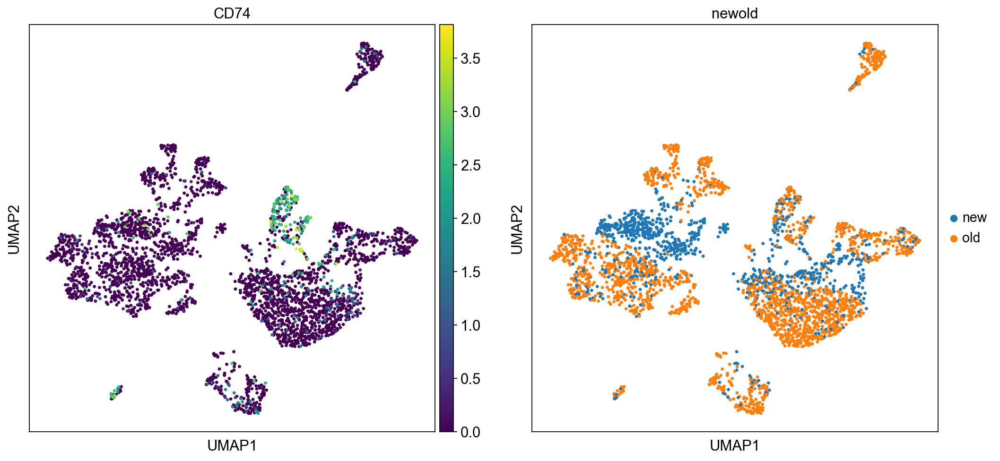

In [107]:
sc.pl.umap(adata_donor_assigned_no_doublets, color=["CD74", "newold"])